In [1]:
# Importing libraries for data manipulation
import pandas as pd
import numpy as np

# Importing libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Ignoring the warnings
import warnings
warnings.filterwarnings('ignore')


## Data Description

* "age" - age bracket of the patient
* "time_in_hospital" - days (from 1 to 14)
* "n_procedures" - number of procedures performed during the hospital stay
* "n_lab_procedures" - number of laboratory procedures performed during the hospital stay
* "n_medications" - number of medications administered during the hospital stay
* "n_outpatient" - number of outpatient visits in the year before a hospital stay
* "n_inpatient" - number of inpatient visits in the year before the hospital stay
* "n_emergency" - number of visits to the emergency room in the year before the hospital stay
* "medical_specialty" - the specialty of the admitting physician
* "diag_1" - primary diagnosis (Circulatory, Respiratory, Digestive, etc.)
* "diag_2" - secondary diagnosis
* "diag_3" - additional secondary diagnosis
* "glucose_test" - whether the glucose serum came out as high (> 200), normal, or not performed
* "A1Ctest" - whether the A1C level of the patient came out as high (> 7%), normal, or not performed
* "change" - whether there was a change in the diabetes medication ('yes' or 'no')
* "diabetes_med" - whether a diabetes medication was prescribed ('yes' or 'no')
* "readmitted" - if the patient was readmitted at the hospital ('yes' or 'no')

In [2]:
data = pd.read_csv('hospital_readmissions.csv')

In [3]:
# data = pd.read_csv('/content/hospital_readmissions.csv')

In [4]:
df = data.copy()

In [5]:
df.shape

(25000, 17)

* The data has 25000 rows and 17 columns.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   age                25000 non-null  object
 1   time_in_hospital   25000 non-null  int64 
 2   n_lab_procedures   25000 non-null  int64 
 3   n_procedures       25000 non-null  int64 
 4   n_medications      25000 non-null  int64 
 5   n_outpatient       25000 non-null  int64 
 6   n_inpatient        25000 non-null  int64 
 7   n_emergency        25000 non-null  int64 
 8   medical_specialty  25000 non-null  object
 9   diag_1             25000 non-null  object
 10  diag_2             25000 non-null  object
 11  diag_3             25000 non-null  object
 12  glucose_test       25000 non-null  object
 13  A1Ctest            25000 non-null  object
 14  change             25000 non-null  object
 15  diabetes_med       25000 non-null  object
 16  readmitted         25000 non-null  objec

* The data has mixed data tpyes of objects and integers.
* Does not seem to have null values.
* The 'age' variable needs to be checked since it is normally numeric value.

In [7]:
# Checking the age variable
df['age'].value_counts(1)

age
[70-80)     0.27348
[60-70)     0.23652
[80-90)     0.18064
[50-60)     0.17808
[40-50)     0.10128
[90-100)    0.03000
Name: proportion, dtype: float64

* The age variable is the range of ages, ranging 10 years.

In [8]:
# Checking the missing values
df.isnull().any()

age                  False
time_in_hospital     False
n_lab_procedures     False
n_procedures         False
n_medications        False
n_outpatient         False
n_inpatient          False
n_emergency          False
medical_specialty    False
diag_1               False
diag_2               False
diag_3               False
glucose_test         False
A1Ctest              False
change               False
diabetes_med         False
readmitted           False
dtype: bool

* It seems there are no missing values in the data.
* However, it is always important to check the categorical variables if they have any strange values that needs to be dealt.

In [9]:
# Checking if there are any duplicated rows
df.duplicated().any()

False

* There are no duplicated rows.

In [10]:
# Creating a list for numerical variables
num_cols = df.select_dtypes(include = np.number).columns.tolist()
num_cols

['time_in_hospital',
 'n_lab_procedures',
 'n_procedures',
 'n_medications',
 'n_outpatient',
 'n_inpatient',
 'n_emergency']

In [11]:
# Checking the values of the numerical variables
for col in df[num_cols]:
        print(df[col].value_counts(1))
        print('-' * 25)

time_in_hospital
3     0.17244
2     0.15944
1     0.13920
4     0.13868
5     0.10168
6     0.07580
7     0.05868
8     0.04416
9     0.03072
10    0.02352
11    0.01832
12    0.01416
13    0.01196
14    0.01124
Name: proportion, dtype: float64
-------------------------
n_lab_procedures
1      0.03004
43     0.02552
44     0.02356
45     0.02288
38     0.02188
        ...   
102    0.00004
103    0.00004
111    0.00004
113    0.00004
109    0.00004
Name: proportion, Length: 109, dtype: float64
-------------------------
n_procedures
0    0.45636
1    0.20392
2    0.12256
3    0.09580
6    0.04908
4    0.03996
5    0.03232
Name: proportion, dtype: float64
-------------------------
n_medications
12    0.06036
15    0.05876
13    0.05836
11    0.05584
14    0.05584
       ...   
68    0.00008
79    0.00004
72    0.00004
75    0.00004
64    0.00004
Name: proportion, Length: 70, dtype: float64
-------------------------
n_outpatient
0     0.83436
1     0.08304
2     0.03652
3     0.02148
4  

* No numeric variables seem to be categorized in small number.

In [12]:
# Creating a list for categorical variables
cat_cols = df.select_dtypes(include = 'object').columns.tolist()
cat_cols

['age',
 'medical_specialty',
 'diag_1',
 'diag_2',
 'diag_3',
 'glucose_test',
 'A1Ctest',
 'change',
 'diabetes_med',
 'readmitted']

In [13]:
# Checking the values of the categorical variables
for col in df[cat_cols]:
        print(df[col].value_counts(1))
        print('-' * 25)

age
[70-80)     0.27348
[60-70)     0.23652
[80-90)     0.18064
[50-60)     0.17808
[40-50)     0.10128
[90-100)    0.03000
Name: proportion, dtype: float64
-------------------------
medical_specialty
Missing                   0.49528
InternalMedicine          0.14260
Other                     0.10656
Emergency/Trauma          0.07540
Family/GeneralPractice    0.07528
Cardiology                0.05636
Surgery                   0.04852
Name: proportion, dtype: float64
-------------------------
diag_1
Circulatory        0.31296
Other              0.25992
Respiratory        0.14720
Digestive          0.09316
Diabetes           0.06988
Injury             0.06664
Musculoskeletal    0.05008
Missing            0.00016
Name: proportion, dtype: float64
-------------------------
diag_2
Other              0.36224
Circulatory        0.32536
Diabetes           0.11624
Respiratory        0.11488
Digestive          0.03892
Injury             0.02364
Musculoskeletal    0.01704
Missing            0.001

* There are some values that are categorized as missing in diag_1,diag_2, and diag_3.
* However, it is common for medical data to have values such as missing or not answered so these data will not be treated in any way.

**Converting the target variable to integer data type**

In [14]:
# Converting readmitted variable to numeric feature - yes to 1 and no to 0
df['readmitted'] = df['readmitted'].apply(lambda x: 1 if x == 'yes' else 0)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   age                25000 non-null  object
 1   time_in_hospital   25000 non-null  int64 
 2   n_lab_procedures   25000 non-null  int64 
 3   n_procedures       25000 non-null  int64 
 4   n_medications      25000 non-null  int64 
 5   n_outpatient       25000 non-null  int64 
 6   n_inpatient        25000 non-null  int64 
 7   n_emergency        25000 non-null  int64 
 8   medical_specialty  25000 non-null  object
 9   diag_1             25000 non-null  object
 10  diag_2             25000 non-null  object
 11  diag_3             25000 non-null  object
 12  glucose_test       25000 non-null  object
 13  A1Ctest            25000 non-null  object
 14  change             25000 non-null  object
 15  diabetes_med       25000 non-null  object
 16  readmitted         25000 non-null  int64

* readmitted has been successfully converted to integer data type.

## Data Splitting

In [15]:
# Selecting the numeric features
num_cols = df.select_dtypes(np.number).columns.tolist()

In [16]:
# Subsetting the numeric features
df1 = df[num_cols]
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   time_in_hospital  25000 non-null  int64
 1   n_lab_procedures  25000 non-null  int64
 2   n_procedures      25000 non-null  int64
 3   n_medications     25000 non-null  int64
 4   n_outpatient      25000 non-null  int64
 5   n_inpatient       25000 non-null  int64
 6   n_emergency       25000 non-null  int64
 7   readmitted        25000 non-null  int64
dtypes: int64(8)
memory usage: 1.5 MB


In [17]:
# Spliting the data
X = df1.drop(['readmitted'], axis = 1) # Predictors
y = df1['readmitted'] # Target

Univariate Feature Selection

In [18]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

test = SelectKBest(score_func = chi2,k = 2)
fit = test.fit(X,y)
print(fit.scores_)

[  94.12274905  246.84397578  107.52813673  135.86248154  889.07425241
 2542.5104289   919.49630781]


Recursive Feature Elimination (RFE)

In [19]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

log_model=LogisticRegression()
rfe=RFE(log_model,n_features_to_select=2)
fit=rfe.fit(X,y)
print(fit.ranking_)

[4 6 3 5 2 1 1]


Extra Tree Classifier

In [20]:
from sklearn.ensemble import ExtraTreesClassifier

ext_model = ExtraTreesClassifier() # Define the model
ext_model.fit(X,y)  # apply model over data
print(ext_model.feature_importances_)

[0.12315415 0.41385085 0.05248902 0.26320931 0.0461517  0.07030712
 0.03083786]


* According to univariate feature selection and RFE n_emergency and n_inpatient are the most important features.

* n_lab_procedures and n_medications are the most significant features according to ExtraTreeClassifier

* Although the result of the two tests are identical, we select n_lab_procedures and n_medications as ExtraTreeClassifier considers interactions between features to capture their intricate associations.

## Data Visualization

**Bar & Pie Chart**

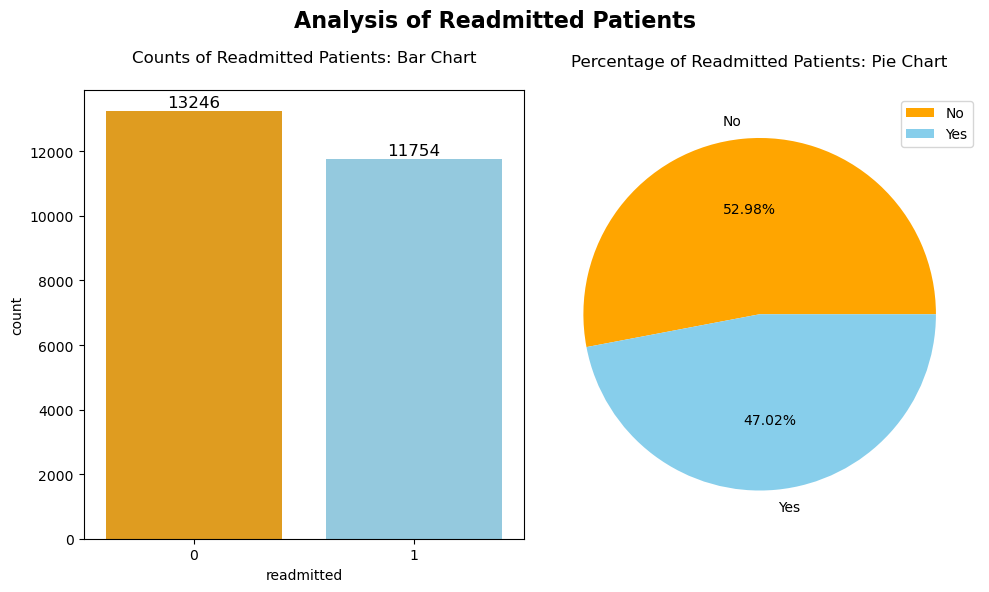

In [21]:
# Plotting bar and pie chart for readmitted variable
fig, (ax_bar, ax_pie) = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 6))

# Setting title for the whole
fig.suptitle('Analysis of Readmitted Patients', fontsize = 16, fontweight = 'bold')

# Plotting bar chart
sns.countplot(data = df1, x = 'readmitted', ax = ax_bar, palette = ['orange', 'skyblue'])
ax_bar.set_title('Counts of Readmitted Patients: Bar Chart', pad = 20, loc = 'center')

# Annotating bar chart with counts
for bar in ax_bar.patches:
    y = int(bar.get_height()) # getting the number of values for each bar
    x = bar.get_x() + bar.get_width() / 2 # getting the center poistion of each bar

    # annotating each bar
    ax_bar.annotate(y, # labeling the bar with y number of values
                    (x, y), # positioning the label in the center of x and y (top) of each bar
                    xytext = (0, 6), # offseting the label
                    textcoords = "offset points", # confirming the offset is given in points
                    ha = 'center', va='center', # setting the horizontal & vertical alignment to center
                    size = 12) # setting the size of the annotation

# Plotting pie chart
perc = df1['readmitted'].value_counts(1) # getting the percentage of values for each values
labels = ['No', 'Yes'] # setting the labels to No and Yes

# Annotating pie char with percentage
ax_pie.pie(perc, # data used to plot pie chart
           labels = labels, # setting the labels
           autopct = '%1.2f%%', # displaying the percentage with two digits after decimal point
           colors = ['orange', 'skyblue']) # setting the color of the portions
ax_pie.set_title('Percentage of Readmitted Patients: Pie Chart', pad = 20, loc = 'center')

plt.tight_layout()
plt.legend()
plt.show()

* The bar and pie chart are showing the number and percentage of the patients in terms of their readmittance to the hospital.

* The bar chart shows 13246 patients who did not readmitted and 11754 patients who readmitted within 2 weeks.

* The bar chart shows 52.98 percent of patients who did not readmitted and 47.02 percent of patients who readmitted within 2 weeks.

**Scatter Plots**

In [22]:
selected_features = ['readmitted', 'n_lab_procedures', 'n_medications']

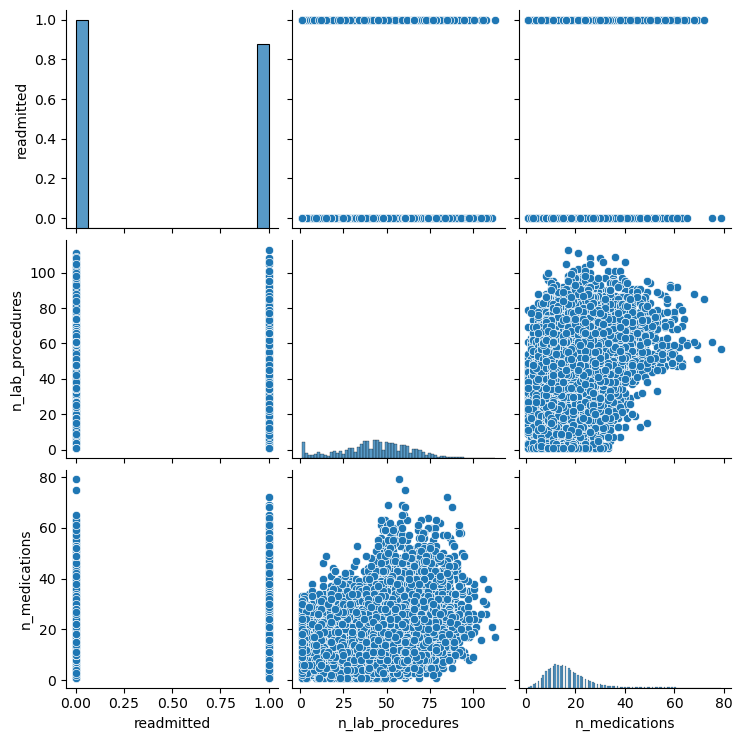

In [23]:
sns.pairplot(df1[selected_features])

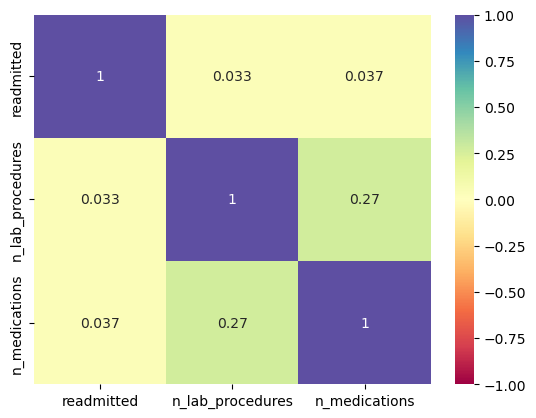

In [24]:
sns.heatmap(df1[selected_features].corr(), vmin = -1, vmax = 1, cmap = 'Spectral', annot = True)
plt.show()

* The number of lab procedures and number of medications show slight assocation with each other.

Histogram and boxplots

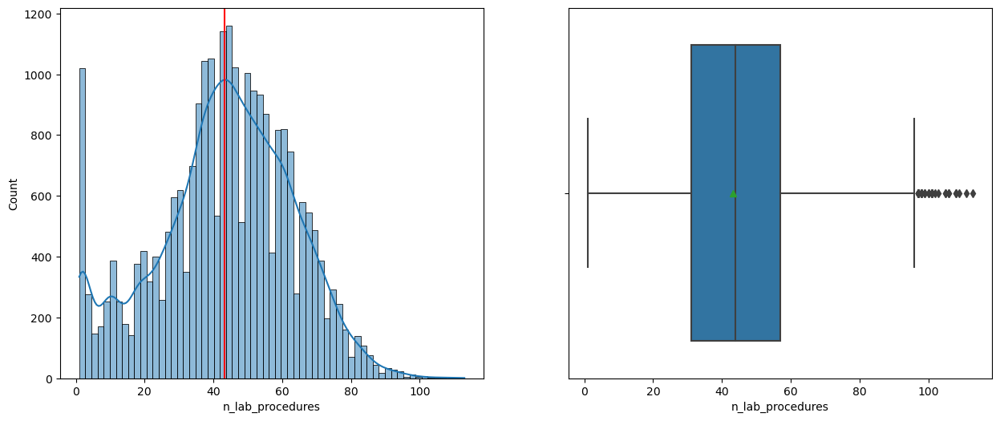

In [25]:
# Plotting the n_inpatient feature from data.

# Setting two axs for histogram & boxplot, the plots have one row and two columns, and share the range of x-axis with plot size of (10, 6).
fig, (ax_hist, ax_box) = plt.subplots(nrows = 1, ncols = 2, sharex = True, figsize = (15, 6))

# Plotting the histogram with kde and mean value.
sns.histplot(data = df1, x = 'n_lab_procedures', kde = True, ax = ax_hist)
ax_hist.axvline(df1['n_lab_procedures'].mean(), color = 'red', linestyle = '-')

# Plotting the boxplot with mean value.
sns.boxplot(data = df1, x = 'n_lab_procedures', showmeans = True, ax = ax_box)
plt.show()

In [26]:
df['n_lab_procedures'].mean()

43.24076

In [27]:
df['n_lab_procedures'].value_counts(1).sort_values(ascending = False).head()

n_lab_procedures
1     0.03004
43    0.02552
44    0.02356
45    0.02288
38    0.02188
Name: proportion, dtype: float64

* The histogram and boxplot is sligtly right-skewed with mean value approximately 43.

* The number of laboratory procedures performed during the hospital stay ranges from 0 to over 100.

* It is noticed that most of the values are focused on the center (between approximately 30 and 60), but the highest proportion of the data lies in 1.

* Most of the values close to 100 are outliers.

* It is important to decide how to deal with these outliers based on the context of the project.

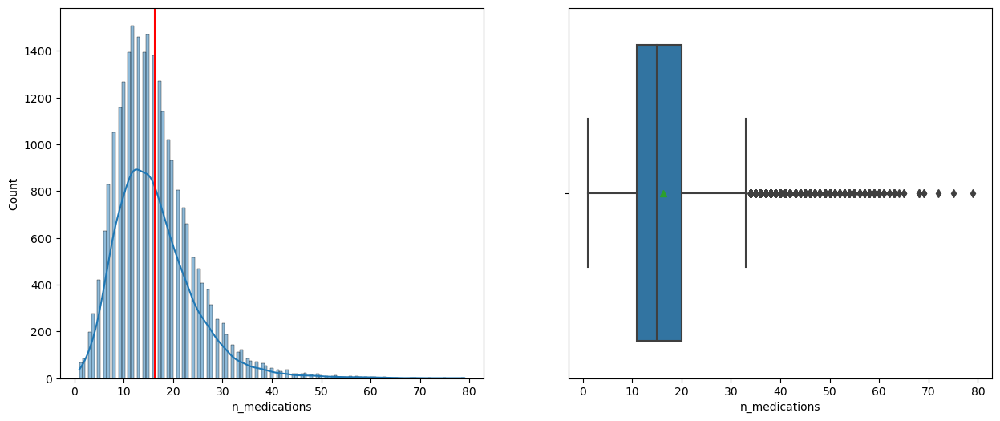

In [28]:
# Plotting the n_emergency feature from data.

# Setting two axs for histogram & boxplot, the plots have one row and two columns, and share the range of x-axis with plot size of (10, 6).
fig, (ax_hist, ax_box) = plt.subplots(nrows = 1, ncols = 2, sharex = True, figsize = (15, 6))

# Plotting the histogram with kde and mean value.
sns.histplot(data = df1, x = 'n_medications', kde = True, ax = ax_hist)
ax_hist.axvline(df1['n_medications'].mean(), color = 'red', linestyle = '-')

# Plotting the boxplot with mean value.
sns.boxplot(data = df1, x = 'n_medications', showmeans = True, ax = ax_box)
plt.show()

In [29]:
df['n_medications'].mean()

16.2524

In [30]:
df['n_medications'].value_counts(1).sort_values(ascending = False).head()

n_medications
12    0.06036
15    0.05876
13    0.05836
11    0.05584
14    0.05584
Name: proportion, dtype: float64

* The histogram and boxplot is highly right-skewed.

* The number of medications administered during the hospital stay ranges from 0 to nearly 80, the skeweness inidcates extreme outliers.

* It is also noticed that the majority of medications administered during the hospital stay are centered between 10 and 20 with mean value of approximately 16.

* It is important to decide how to deal with these outliers based on the context of the project.

------------------------------


#### Project3
####step6


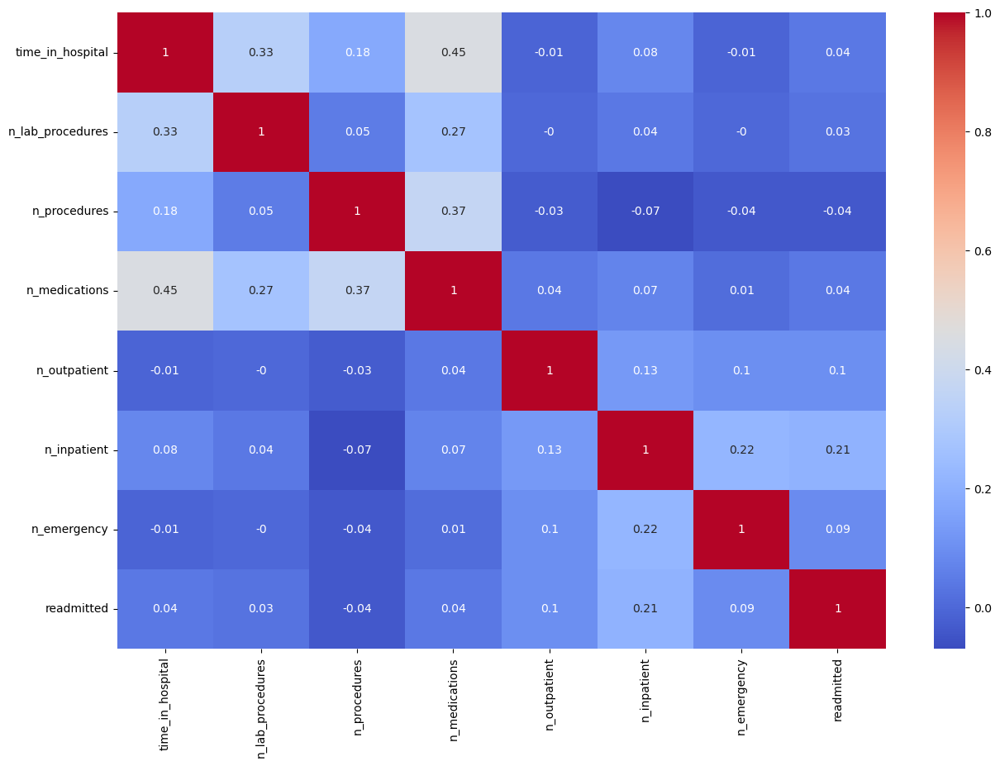

In [31]:
# Select numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=['float64', 'int64'])
corr = numeric_df.corr().round(2)

# Plot heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()


**Interpretation:**

We make a new dataframe `numeric_df` that only contains the numeric columns, and based on this new dataframe, we plot the confusion matrix.

The numbers in each square represent the Pearson correlation coefficient between two variables, which can range from -1 (red) to 1 (blue). Based on the result, we can see that the feature `time_in_hospital` has a moderate positive correlation (0.45) with `n_medications`, and also `time_in_hospital` has a positive correlation (0.33) with `n_lab_procedures`.

Thus, the following linear regression will be designed such that the target (y) is `time_in_hospital` and the features are `n_medications` and `n_lab_procedures`.



In [32]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score


# Features (X) and categorical target (y)

X2 = numeric_df[[ 'n_lab_procedures', 'n_medications']] # input variables
y2 = numeric_df['time_in_hospital']  # target

# Train/test split
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=42)

# Linear regression model
model = LinearRegression()
model.fit(X_train2, y_train2)

coefficients = model.coef_
intercept = model.intercept_

# Print the results
print("Coefficients (a):", coefficients)
print("Intercept (b):", intercept)

# Combine to equation
equation = f"y = {coefficients[0]:.4f} * n_lab_procedures + {coefficients[1]:.4f} * n_medications + {intercept:.4f}"
print("The whole equation:", equation)

print('')
# Predictions
y_pred = model.predict(X_test2)

# Evaluate
mse = mean_squared_error(y_test2, y_pred)
print('Mean Squared Error:', mse)

r2 = r2_score(y_test2, y_pred)
print("R-squared:", r2)

Coefficients (a): [0.03394457 0.14420349]
Intercept (b): 0.6472512844126497
The whole equation: y = 0.0339 * n_lab_procedures + 0.1442 * n_medications + 0.6473

Mean Squared Error: 6.8213285562503225
R-squared: 0.24847343935036892


**Interpretation**:

The linear regression coefficient is -> y = 0.0339 * n_lab_procedures + 0.1442 * n_medications + 0.6473



The linear regression model has a low R² score of around 24.84%. The MSE (6.821) is quite high. Based on these two evaluations, it seems that the forecast is not very accurate.



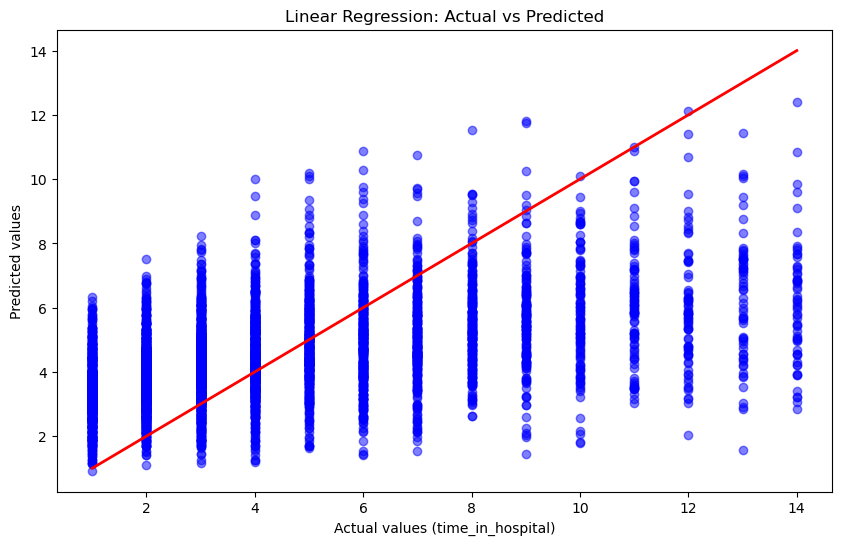

In [33]:
# Plot the linear regression

# Plot the actual vs predicted values
plt.figure(figsize=(10,6))
plt.scatter(y_test2, y_pred, color='blue', alpha=0.5)
plt.plot([min(y_test2), max(y_test2)], [min(y_test2), max(y_test2)], color='red', linewidth=2)

# Add labels and title
plt.title("Linear Regression: Actual vs Predicted")
plt.xlabel("Actual values (time_in_hospital)")
plt.ylabel("Predicted values")

plt.show()

**Interpretation**:

In this scatter plot, each blue dot represents an actual `time_in_hospital` value. The red line shows the prediction line from the model.  

However, when the actual time_in_hospital grows, the model's predictions begin to diverge dramatically, as seen by the distribution of points above and below the red line. This shows that the model is unable to reliably anticipate lengthier hospital stays.

### Feature Engineering for Confusion Matrix



In [34]:
y_train2.median()

4.0

* Our target variable in this step 'time_in_hospital' is the number of days between 1 to 14 days, we will classify the values in this variable as over-staying (1) and under-staying (0) on median based.

* All the values lower or the same with 4 (median) will be classified as under-staying (0) and the rest will be classified as over-staying(1).

In [35]:
# Copying the data to be used for confusion matrix
y_train3 = y_train2.copy()
X_train3 = X_train2.copy()

In [36]:
# Applying our classification standards to values in y_train3
y_train3 = y_train3.apply(lambda x: 0 if x <= 4 else 1)

# Checking the application
y_train3.value_counts(1)

time_in_hospital
0    0.60745
1    0.39255
Name: proportion, dtype: float64

* The values has been converted and classified into 0 (under-staying) and 1 (over-staying).

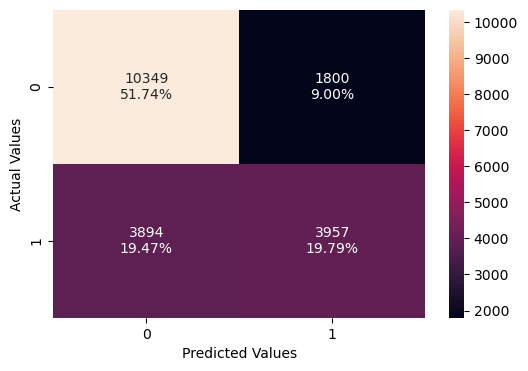

In [37]:
# Importing libraires for confusion matrix
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Defining Logistic Regression model
logr = LogisticRegression()
log_mod = logr.fit(X_train3, y_train3)

# Making predictions according to the training data
y_pred = log_mod.predict(X_train3)

# Creating confusion matrix for the predictions
cm = confusion_matrix(y_train3, y_pred)

# Visualizing confusion matrix

# Creating annotations based on the number and percentage of each predictions on confusion matrix
labels = np.asarray([['{0:0.0f}'.format(item) + '\n{0:0.2%}'.format(item / cm.flatten().sum())]
                     for item in cm.flatten()]).reshape(2, 2)

plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = labels, fmt='')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

Interpretation:

* True Negatives (10349): These patients are correctly classified as under-stayed (0).
* False Negatives (3894): These patients are actually over-stayed but were misclassified as under-stayed.
* False Positives (1800): These patients are actually under-stayed but were misclassified as overstayed.
* True Positives (3957): These patients are correctly classified as over-stayed patients (1)
* The model is better at predicting under-stayed patients than over-stayed patients.
* The model is missing thousands of over-staying patints judging by thelarge number of Fale Negatives.

We will try the same method with our true target varible of our project 'readmitted'.

In [38]:
# Features (X) and categorical target (y)
X4 = numeric_df[['n_lab_procedures', 'n_medications']] # input variables
y4 = numeric_df['readmitted']  # target

# Train/test split
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4, y4, test_size=0.2, random_state=42)

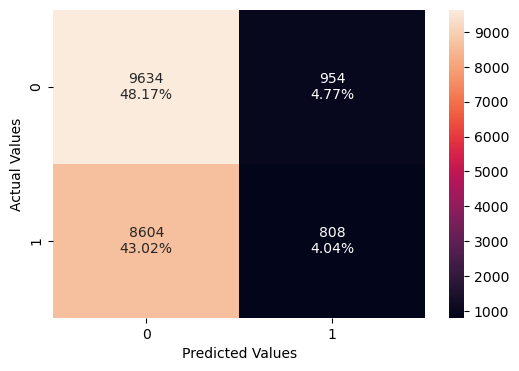

In [39]:
# Defining Logistic Regression model
logr = LogisticRegression()
log_mod = logr.fit(X_train4, y_train4)

# Making predictions according to the training data
y_pred = log_mod.predict(X_train4)

# Creating confusion matrix for the predictions
cm = confusion_matrix(y_train4, y_pred)

# Visualizing confusion matrix

# Creating annotations based on the number and percentage of each predictions on confusion matrix
labels = np.asarray([['{0:0.0f}'.format(item) + '\n{0:0.2%}'.format(item / cm.flatten().sum())]
                     for item in cm.flatten()]).reshape(2, 2)

plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = labels, fmt='')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

Interpretation:

* True Negatives (9634): These patients are correctly classified as non-readmitted patients (0).
* False Negatives (8604): These patients are actually readmitted but were misclassified as non-readmitted.
* False Positives (954): These patients are actually non-readmitted but were misclassified as readmitted.
* True Positives (808): These patients are correctly classified as readmitted patients (1)
* The model is better at predicting non-readmitted patients than readmitted patients.
* The model is missing thousands of non-readmitted patints judging by the large number of False Negatives.

K Nearest Neighbors

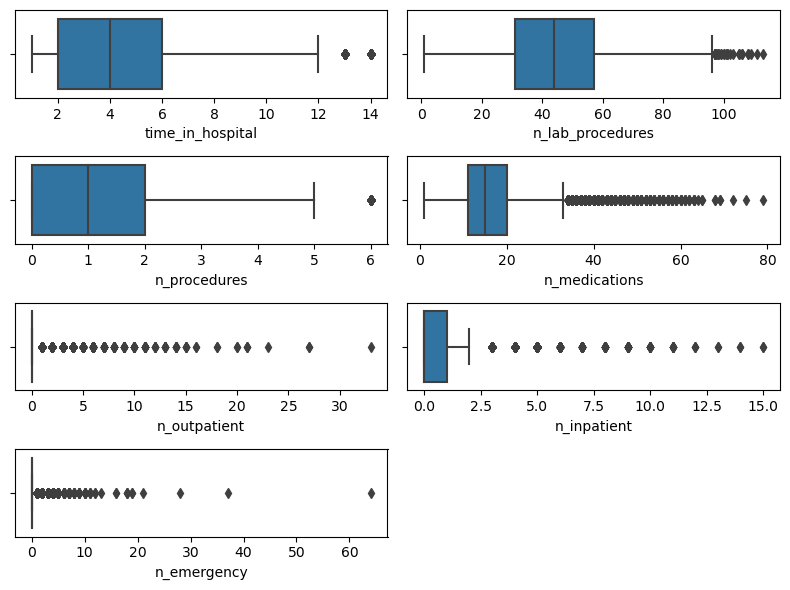

In [40]:
df2 = df.copy()

continuous_columns = ['time_in_hospital', 'n_lab_procedures', 'n_procedures', 'n_medications', 'n_outpatient', 'n_inpatient', 'n_emergency']

plt.figure(figsize = (8, 6))

# Plotting the continuous columns
for i, var in enumerate(continuous_columns):
      plt.subplot(4, 2, i + 1)
      sns.boxplot(data = df2, x = var)
plt.tight_layout()
plt.show()

In [41]:
sqrt_columns = ['time_in_hospital', 'n_lab_procedures', 'n_procedures', 'n_medications']
log_columns = ['n_outpatient', 'n_inpatient', 'n_emergency']

# Transforming columns to be closer to normalization
for col in df2[sqrt_columns]:
    df2[col] = np.sqrt(df2[col] + 1)

for col in df2[log_columns]:
    df2[col] = np.log1p(df2[col])

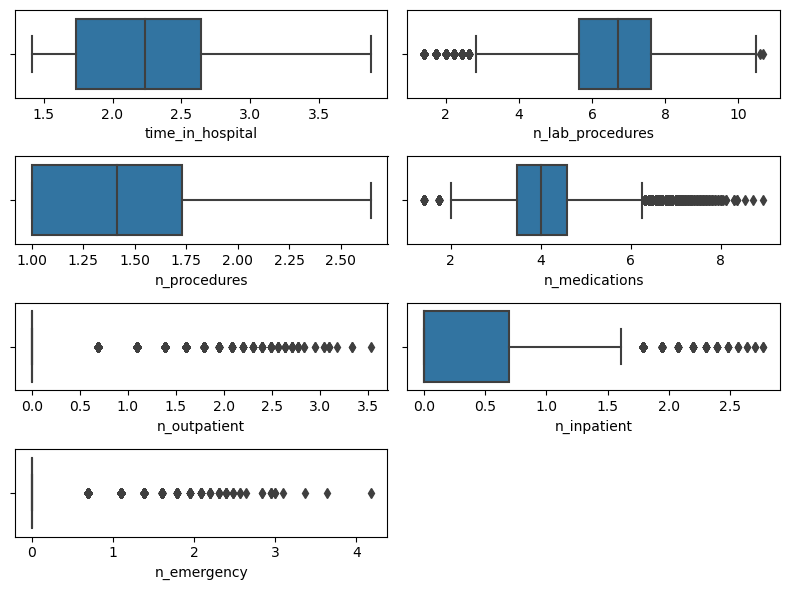

In [42]:
# Plotting the continuous columns
plt.figure(figsize = (8, 6))

for i, var in enumerate(continuous_columns):
      plt.subplot(4, 2, i + 1)
      sns.boxplot(data = df2, x = var)
plt.tight_layout()
plt.show()

* While some attributes are more normalized after transformation, others do not seem to be influenced by the transformation.

In [43]:
X5 = df2[['n_lab_procedures', 'n_medications']]
y5 = df2['readmitted']

X_train5,X_test5, y_train5, y_test5 = train_test_split(X5, y5, test_size = 0.3, random_state = 1)

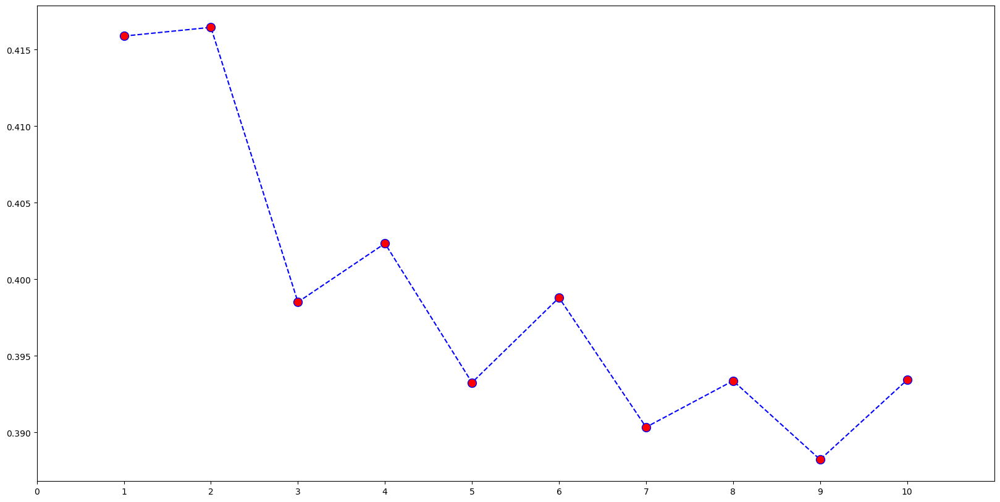

In [44]:
from sklearn.neighbors import KNeighborsClassifier

# Creating empty list
train_errors = []

# Filling the empty list with training errors for each ranging point
for k in range(1,11):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train5, y_train5)

    # Training error
    train_pred = knn.predict(X_train5)
    train_errors.append(np.mean(train_pred != y_train5))

# Plotting the KNN
plt.figure(figsize=(20,10))
plt.xlim(0, 11)
plt.xticks(np.arange(0, 11, step=1))
plt.plot(range(1,11), train_errors, 'b--o', markerfacecolor= 'r', markersize = 10)
plt.show()

The optimal k seems to be 9 as:
* It hass the lowest training error.
* It's large enough to avoid overfitting but not so large as to oversimplify the model.

In [45]:
knn9 = KNeighborsClassifier(n_neighbors = 9)
knn9.fit(X_train5,y_train5)

KNeighborsClassifier(n_neighbors=9)

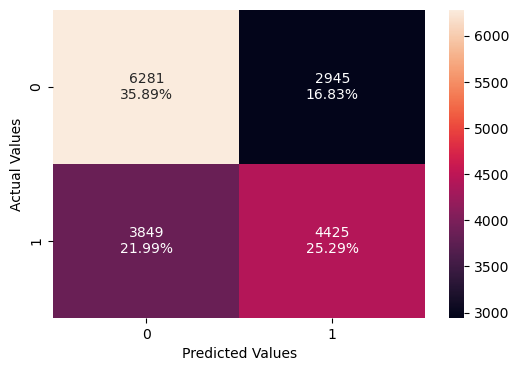

--------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.62      0.68      0.65      9226
           1       0.60      0.53      0.57      8274

    accuracy                           0.61     17500
   macro avg       0.61      0.61      0.61     17500
weighted avg       0.61      0.61      0.61     17500

--------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.55      0.58      0.57      4020
           1       0.48      0.44      0.46      3480

    accuracy                           0.52      7500
   macro avg       0.51      0.51      0.51      7500
weighted avg       0.52      0.52      0.52      7500



In [46]:
y_pred_train = knn9.predict(X_train5)
y_pred_test = knn9.predict(X_test5)

# Creating confusion matrix for the predictions
cm = confusion_matrix(y_train5, y_pred_train)

# Visualizing confusion matrix

# Creating annotations based on the number and percentage of each predictions on confusion matrix
labels = np.asarray([['{0:0.0f}'.format(item) + '\n{0:0.2%}'.format(item / cm.flatten().sum())]
                     for item in cm.flatten()]).reshape(2, 2)

plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = labels, fmt='')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

from sklearn.metrics import classification_report
print('-' * 62)
print(classification_report(y_train5, y_pred_train))

print('-' * 62)
print(classification_report(y_test5, y_pred_test))

In [47]:
k_train_acc = knn9.score(X_train5, y_train5)
k_test_acc = knn9.score(X_test5, y_test5)
print(f"KNeighbors Train accuracy: {k_train_acc:.3f}")
print(f"KNeighbors Test accuracy: {k_test_acc:.3f}")

KNeighbors Train accuracy: 0.612
KNeighbors Test accuracy: 0.520


* The accuracy for training and test accuracy are approximately 61 and 52 percent respectively.
* They model performance is not good.

Naive Bayes Classifier

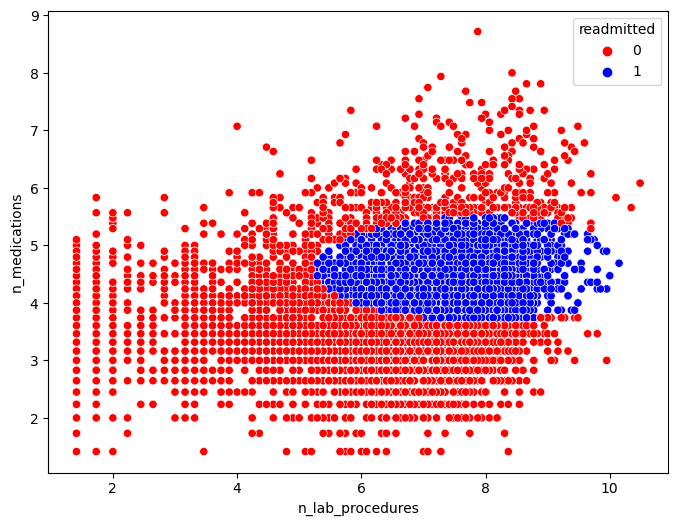

In [48]:
from sklearn.naive_bayes import GaussianNB

# Training the Naive Bayes model
nb = GaussianNB()
nb.fit(X_train5, y_train5)

# Making predictions on the test set
y_pred = nb.predict(X_test5)

# Extracting the relevant features
n_lab_procedures = X_test5.iloc[:, 0]
n_medications = X_test5.iloc[:, 1]

# Creating a DataFrame that will be used for plotting
df_nb = pd.DataFrame({
    'n_lab_procedures': n_lab_procedures,
    'n_medications': n_medications,
    'readmitted': y_pred  # Using the predicted values
})

# Create a scatter plot using seaborn with readmitted as the hue
plt.figure(figsize=(8, 6))
sns.scatterplot(x = 'n_lab_procedures', y = 'n_medications', hue = 'readmitted', data = df_nb, palette = ['red', 'blue'])

# Adding labels
plt.xlabel('n_lab_procedures')
plt.ylabel('n_medications')

# Displaying the plot
plt.show()

- The readmitted points are largely clustered in a region where the number of lab procedures is between 6 and 10, and the number of medications is generally around 4 to 5, indicating a higher number of lab procedures and a relatively moderate number of medications are more likely to be predicted as readmitted NB model.

- The non-readmitted points are more spread out across the plot but are concentrated more heavily in the regions with 4 to 8 number of procedures and 3 to 4 medications.

- This suggests that patients with more lab procedures and medications are more likely to be predicted as readmitted in this model.


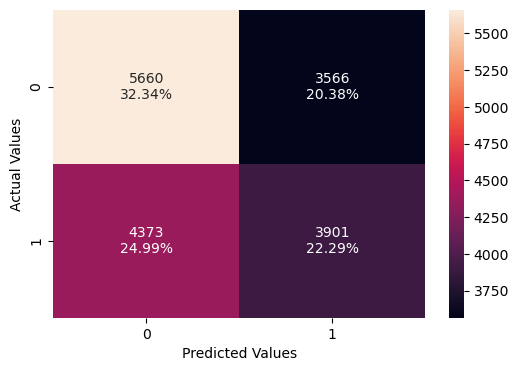

--------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.56      0.61      0.59      9226
           1       0.52      0.47      0.50      8274

    accuracy                           0.55     17500
   macro avg       0.54      0.54      0.54     17500
weighted avg       0.54      0.55      0.54     17500

--------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.57      0.60      0.59      4020
           1       0.51      0.47      0.49      3480

    accuracy                           0.54      7500
   macro avg       0.54      0.54      0.54      7500
weighted avg       0.54      0.54      0.54      7500



In [49]:
y_pred_train = nb.predict(X_train5)
y_pred_test = nb.predict(X_test5)

# Creating confusion matrix for the predictions
cm = confusion_matrix(y_train5, y_pred_train)

# Visualizing confusion matrix

# Creating annotations based on the number and percentage of each predictions on confusion matrix
labels = np.asarray([['{0:0.0f}'.format(item) + '\n{0:0.2%}'.format(item / cm.flatten().sum())]
                     for item in cm.flatten()]).reshape(2, 2)

plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = labels, fmt='')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

from sklearn.metrics import classification_report
print('-' * 62)
print(classification_report(y_train5, y_pred_train))

print('-' * 62)
print(classification_report(y_test5, y_pred_test))

In [50]:
nb_train_acc = nb.score(X_train5, y_train5)
nb_test_acc = nb.score(X_test5, y_test5)
print(f"Naive Bayes Train accuracy: {nb_train_acc:.3f}")
print(f"Naives Bates Test accuracy: {nb_test_acc:.3f}")

Naive Bayes Train accuracy: 0.546
Naives Bates Test accuracy: 0.542


* The accuracy for training and test accuracy are approximately 55 and 54 percent respectively.
* They model performance is not good.
* Although both KNN and NB model do not show good performances, KNN model seems to be slightly better.
* Further measurements such as adding more predictors, feature engineering, or using other modeling techniques are needed.

##### Project 5

In [51]:

#1) Select 2 training features and 1 target column
X6 = df2[['n_lab_procedures', 'n_medications']]
y6 = df2['readmitted']


In [52]:

from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

#split training and testing
X_train6, X_test6, y_train6, y_test6 = train_test_split(X6, y6, test_size=0.8, random_state=42)




In [53]:

# 1.linear kernel
svc=svm.SVC(kernel='linear', C=1).fit(X_train6,y_train6)
svc_pred = svc.predict(X_test6)
print(f'svc accuracy: {accuracy_score(y_test6, svc_pred) * 100:.2f}', "%")

# 2. linear svm
lin_svc=svm.LinearSVC(C=1).fit(X_train6,y_train6)
lsvc_pred=lin_svc.predict(X_train6)
print(f'lsvc accuracy: {accuracy_score(y_train6, lsvc_pred) * 100:.2f}%')

# 3. rbf kernel
rbf_svc=svm.SVC(kernel='rbf', gamma=0.7, C=1).fit(X_train6,y_train6)
rsvc_pred=rbf_svc.predict(X_train6)
print(f'rbf svc accuracy: {accuracy_score(y_train6, rsvc_pred)* 100:.2f}%')

# 4. poly kernel, degree 3 ax^3+bx^2+cx+d
poly_svc=svm.SVC(kernel='poly', degree=3, C=1).fit(X_train6,y_train6)
psvc_pred=poly_svc.predict(X_train6)
print(f'poly svc accuracy: {accuracy_score(y_train6, psvc_pred) * 100:.2f}%')



svc accuracy: 53.15 %
lsvc accuracy: 52.96%
rbf svc accuracy: 55.32%
poly svc accuracy: 53.22%


- According the result of the 4 SVM models, the RBF kernel has the highest accuracy (55.32%).
- However, all 4 models show relatively low accuracy, which means that the SVM models in the current form are not performing well.

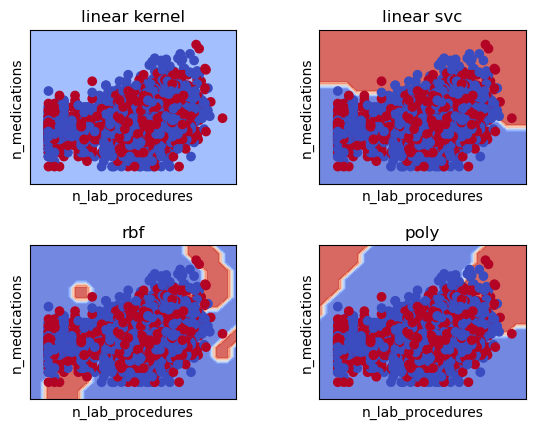

In [54]:
h=0.5
x_min, x_max = X_train6.iloc[:,0].min()-1, X_train6.iloc[:,0].max()+1 # n_lab_procedures over x
y_min, y_max = X_train6.iloc[:,1].min()-1, X_train6.iloc[:,1].max()+1 # n_medications over y
xx, yy=np.meshgrid(np.arange(x_min,x_max,h),np.arange(y_min,y_max,h))

titles=['linear kernel','linear svc','rbf','poly']

for i, clf in enumerate((svc, lin_svc, rbf_svc, poly_svc)):
    # create 4 subplots
    plt.subplot(2,2,i+1)
    plt.subplots_adjust(wspace=0.4,hspace=0.4)

    # predict destinations based on num_code and price
    Z=clf.predict(np.c_[xx.ravel(),yy.ravel()])
    Z=Z.reshape(xx.shape)

    # plot actual and predicted values
    plt.contourf(xx,yy,Z,cmap=plt.cm.coolwarm, alpha=0.8)
    plt.scatter(X_train6.iloc[:,0],X_train6.iloc[:,1], c=y_train6, cmap=plt.cm.coolwarm)

    # modify the graphs by adding labels, titles, ...
    plt.xlabel('n_lab_procedures')
    plt.ylabel('n_medications')
    plt.xlim(xx.min(),xx.max())
    plt.ylim(yy.min(),yy.max())
    plt.xticks(())
    plt.yticks(())
    plt.title(titles[i])

plt.show()

- Based on the result, Linear Kernel and Linear SVM models are too simpliest too this dataset, so they show that overlapping of data points in the opposite regions.
- Rbf kernel and Polynomial kernel models create more flexible, curved decision boundaries, so they have better performance than linear kernels.

**Project 6**

In [55]:
# Import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Preprocess the data
# Map categorical age ranges to numeric values
age_mapping = {
    '[0-10)': 5, '[10-20)': 15, '[20-30)': 25, '[30-40)': 35,
    '[40-50)': 45, '[50-60)': 55, '[60-70)': 65, '[70-80)': 75,
    '[80-90)': 85, '[90-100)': 95
}
data['age'] = data['age'].map(age_mapping)

# Mapping the target column (readmitted: 'yes' -> 1, 'no' -> 0)
data['readmitted'] = data['readmitted'].map({'yes': 1, 'no': 0})

 # Selecting 2-3 features and the target column
features = ['age', 'time_in_hospital', 'n_procedures', 'n_lab_procedures', 'n_medications']  #features
target = 'readmitted'  #target 
X = data[features]
y = data[target]

# Handling missing values
X.fillna(X.mean(), inplace=True)

# Splitting data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define and fit the model
clf = RandomForestClassifier(n_estimators=10, random_state=42)
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test)

# Confusion matrix
CM = confusion_matrix(y_pred, y_test)
print(CM)

# Evaluating the accuracy
AS = accuracy_score(y_pred, y_test)
print(AS)

# Classification report
CR = classification_report(y_pred, y_test)
print(CR)


[[2495 2083]
 [1505 1417]]
0.5216
              precision    recall  f1-score   support

           0       0.62      0.54      0.58      4578
           1       0.40      0.48      0.44      2922

    accuracy                           0.52      7500
   macro avg       0.51      0.51      0.51      7500
weighted avg       0.54      0.52      0.53      7500



- The accuracy of the model is equal to 52.16%, so that a model predicts the outcome in more than half of cases as it should.  
- When deploying in the non-readmitted patient classification (Class 0),the model achieves a precision of 62% and a recall of 54%.  
- For the readmitted patients , the model performs poorly , it was able to classify **48%** correctly and a lower precision of **40%** was observed for these patients .  
- Subsequently, Table 14 reveals that the F1-scores to indicate that the model prefers non-readmitted (**0.58**) than readmitted (**0.44**) cases.  
- All in all they need to improve the model especially in identification of patients at risk for re admission.

In [56]:
from sklearn.tree import export_graphviz
import graphviz

In [57]:
rf=RandomForestClassifier(n_estimators=10)
rf.fit(X_train,y_train)

RandomForestClassifier(n_estimators=10)

In [58]:
len(rf.estimators_)

10

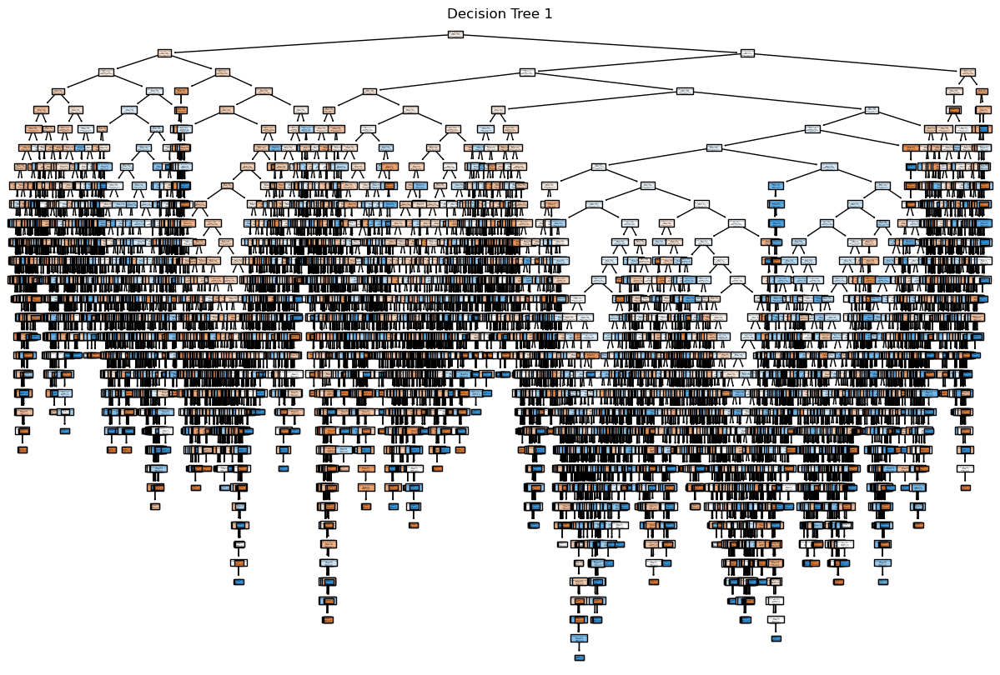

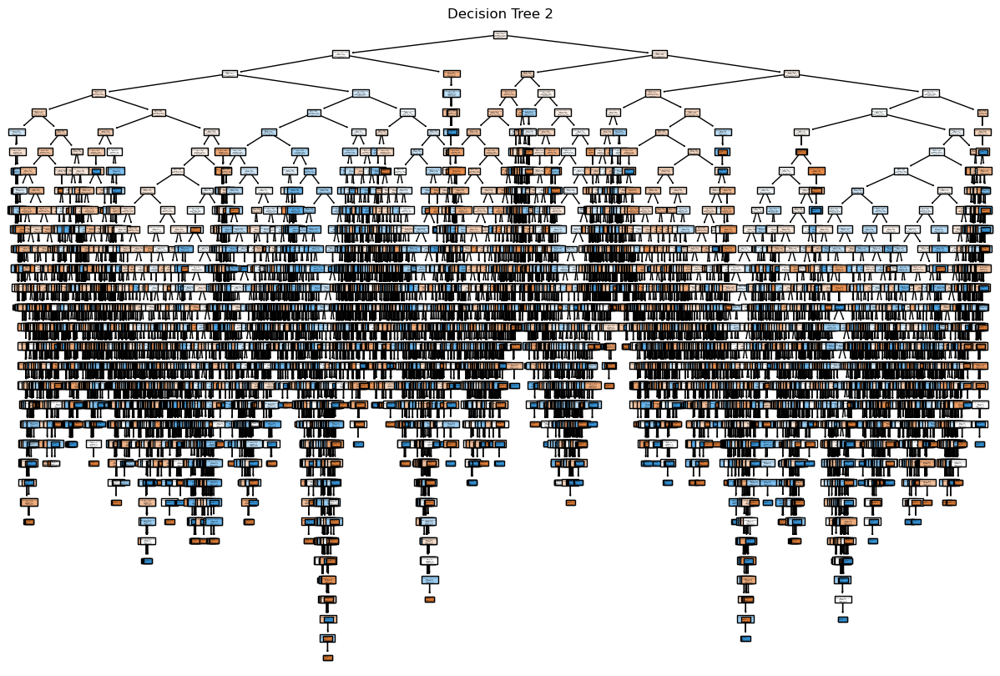

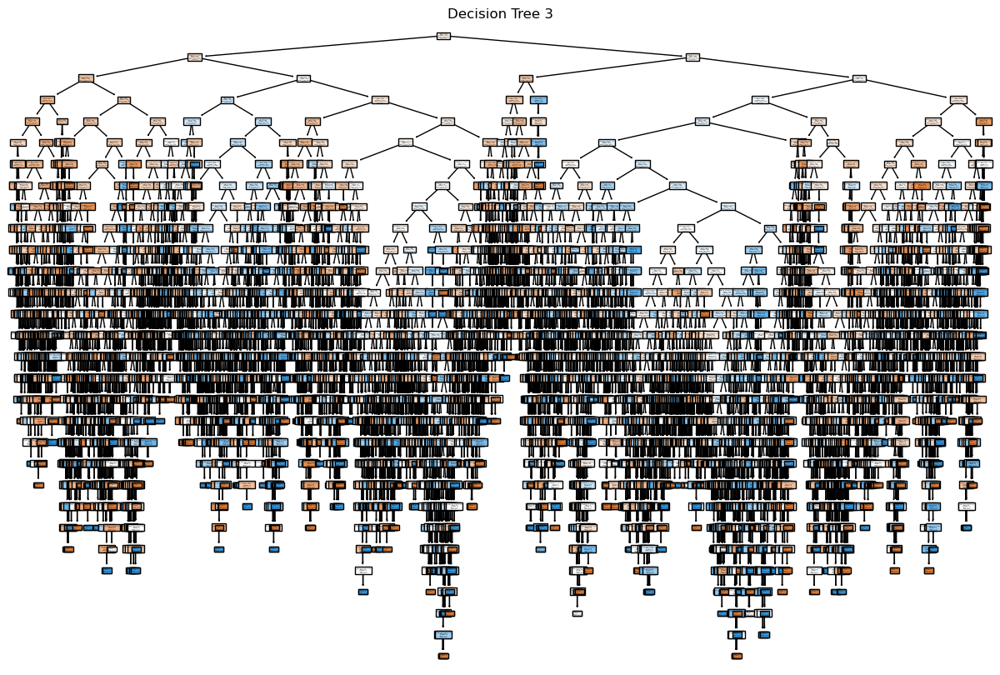

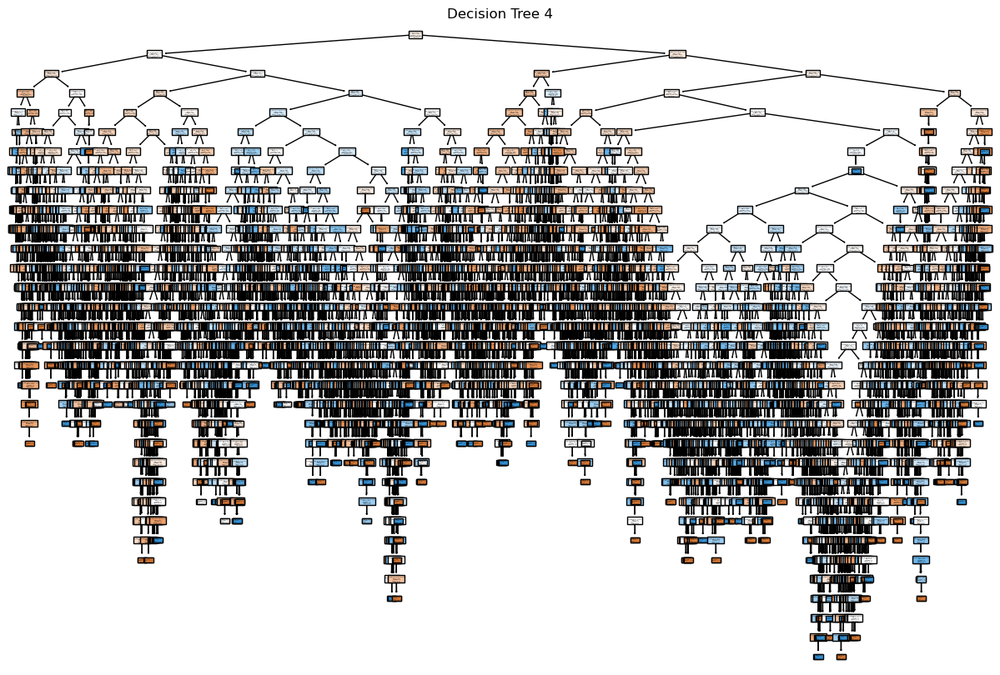

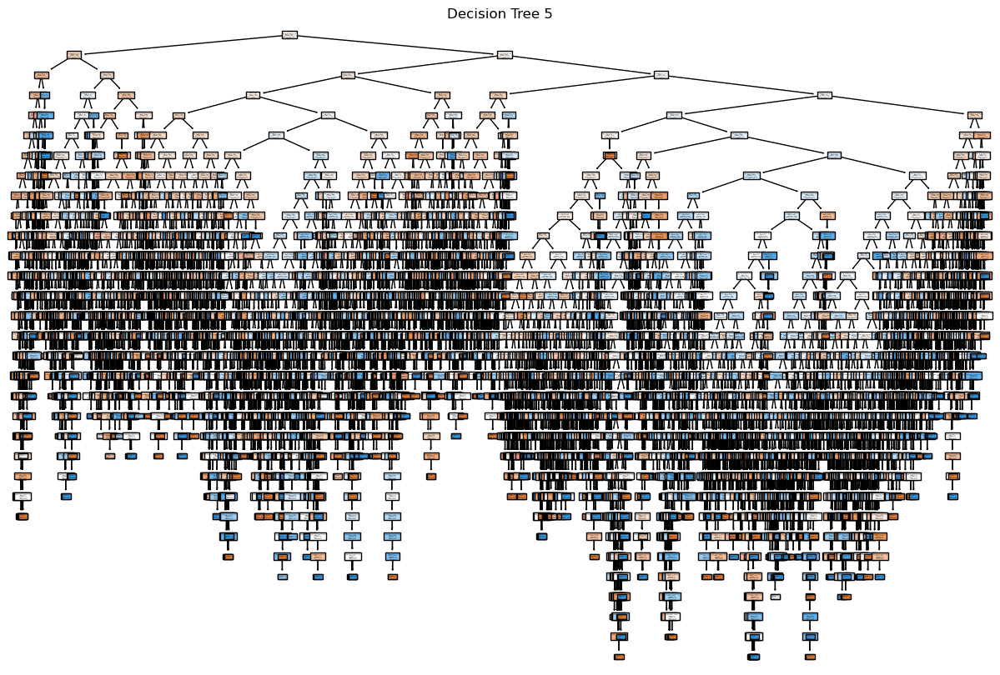

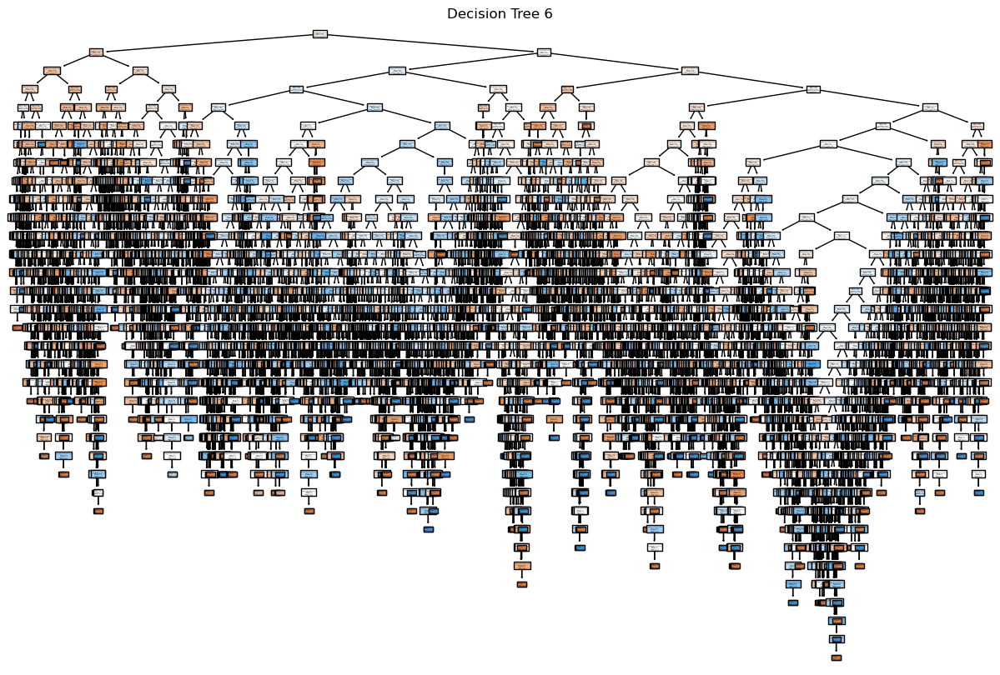

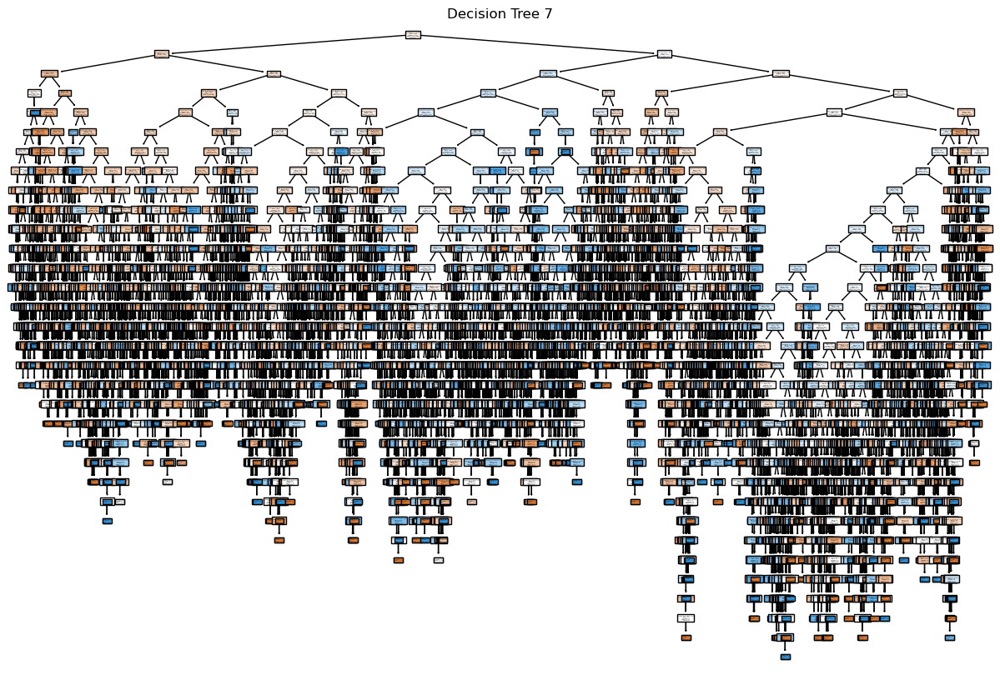

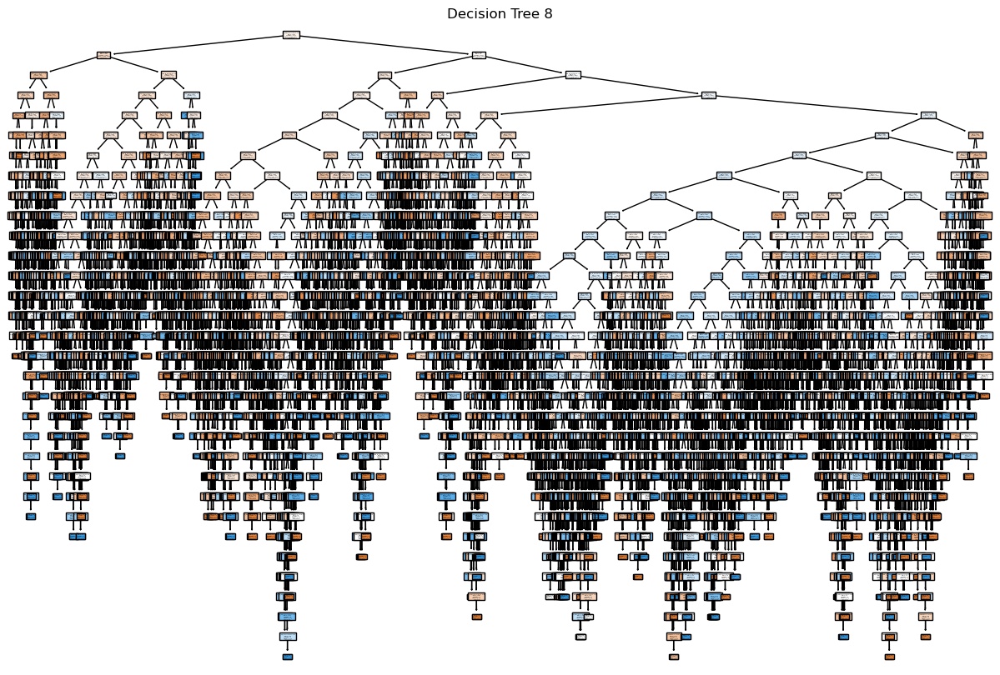

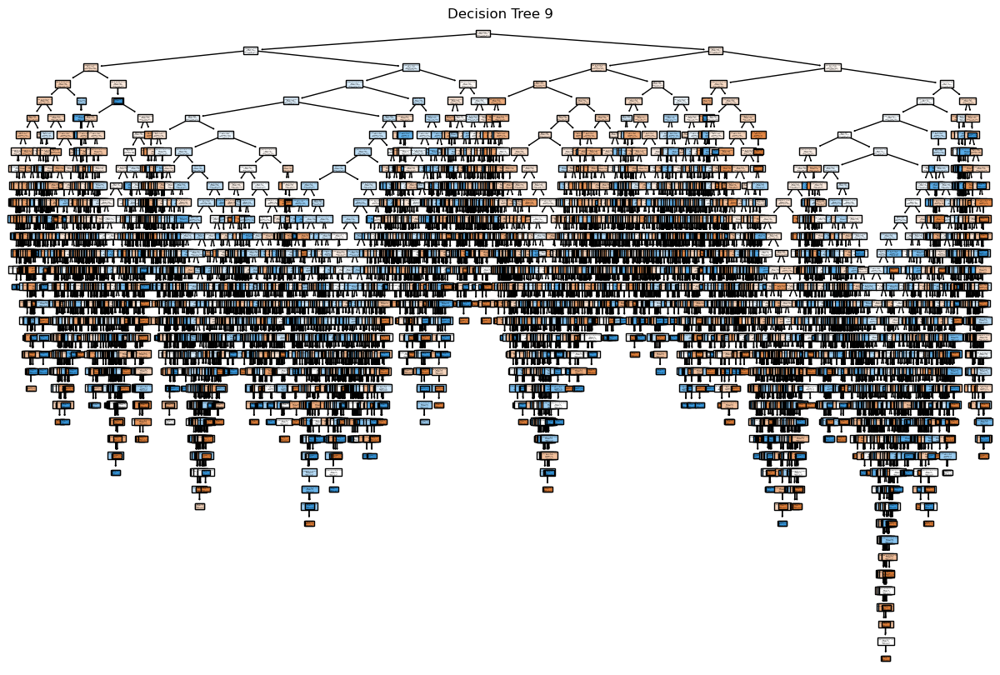

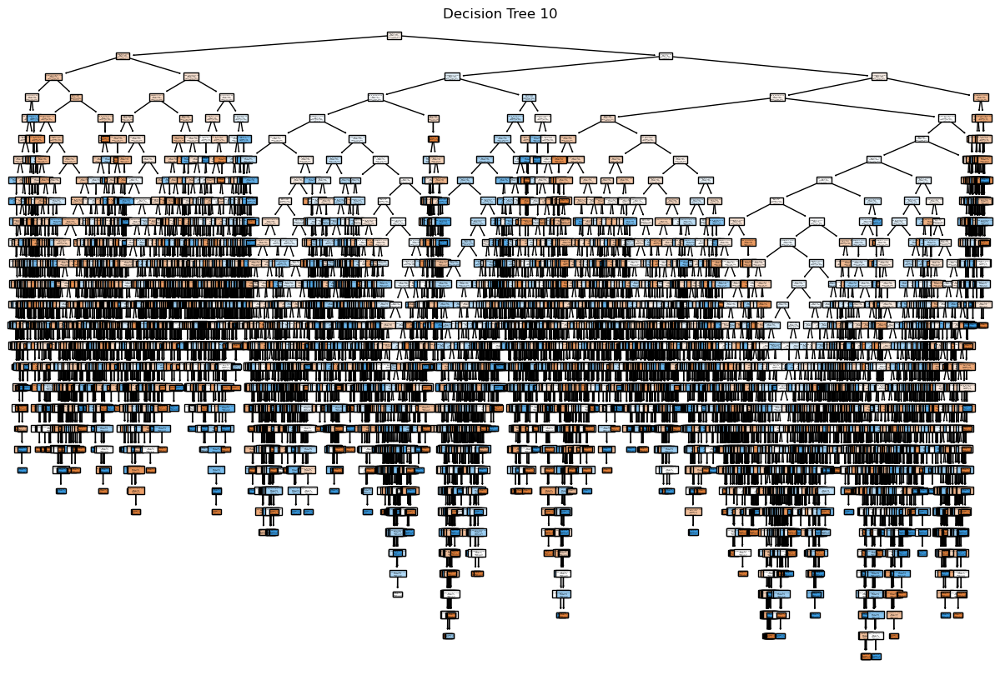

In [59]:
from sklearn import tree
import matplotlib.pyplot as plt

# Plot all decision trees from the Random Forest
for i, estimator in enumerate(rf.estimators_):
    plt.figure(figsize=(15, 10))
    _ = tree.plot_tree(
        estimator, 
        feature_names=features, 
        class_names=['No', 'Yes'],  
        filled=True
    )
    plt.title(f'Decision Tree {i+1}')
    plt.show()


- Random Forest is like many decision trees – it takes data from each tree randomly to make predictions.  
- One may view it as consulting a group of gurus (trees) and since most of the gurus recommend something in particular – then that is the best way to go.  
- This is an evidence that these features including the ‘age’ and the ‘time in hospital’ are important in predictions as used in the trees first.  
- Even singular trees, could sometimes give wrong responses or overcomplicate the decision with too much processing, but in a bag, they counteract and prevent overfitting.  
- In sum, Random Forest works uniquely like a group comprising several decision trees and as a result provides more accurate and reliable results than any single tree.  

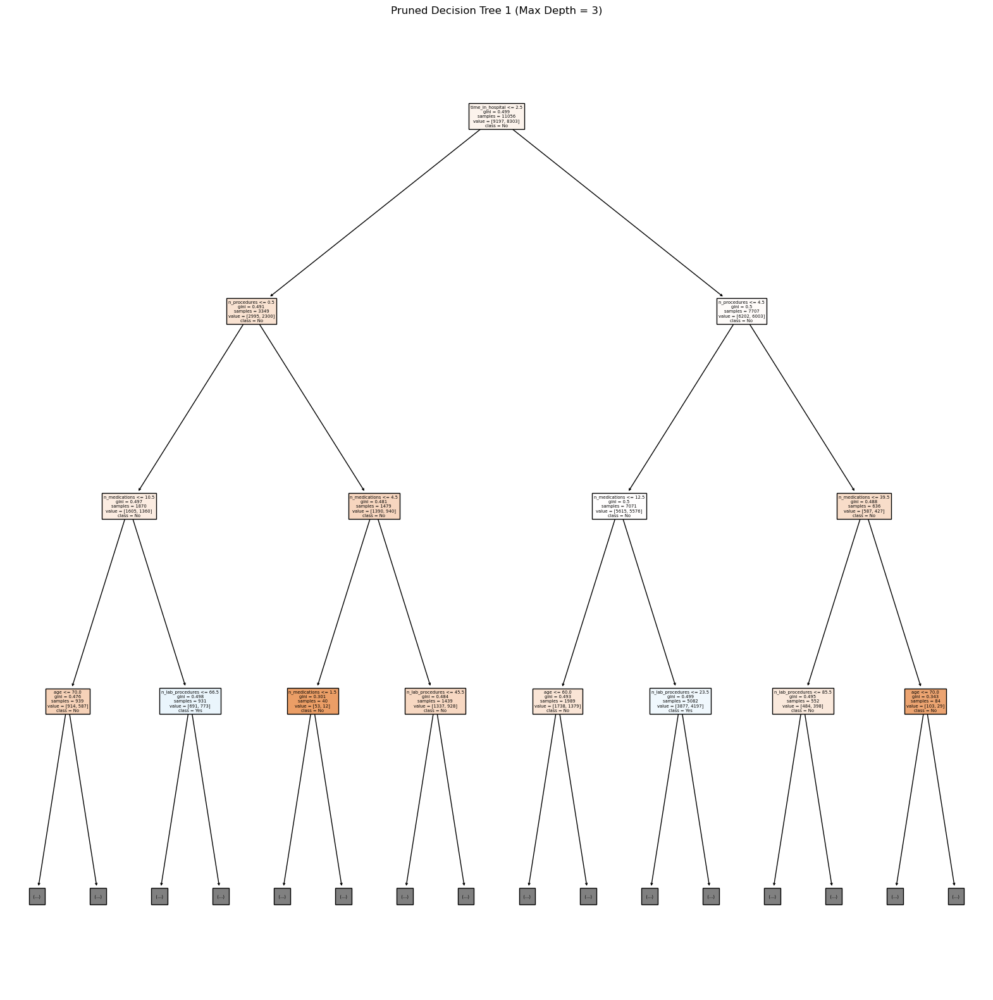

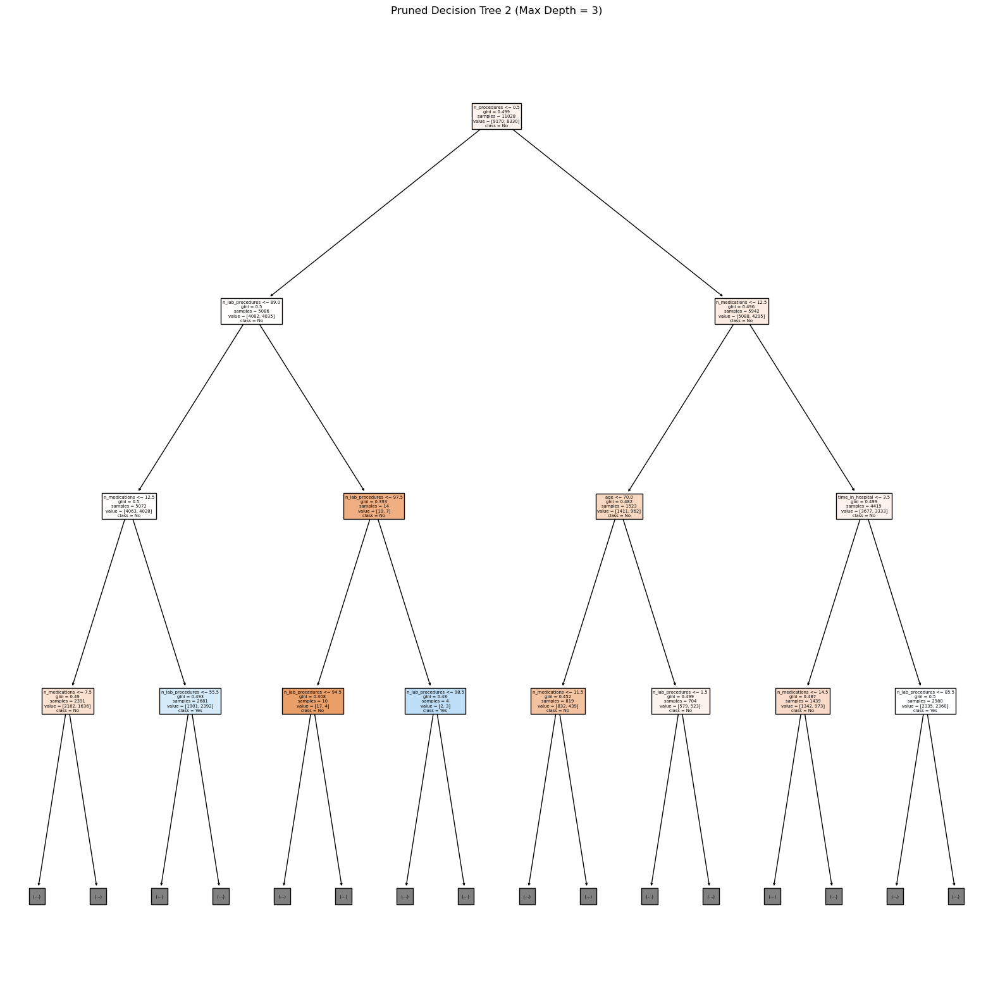

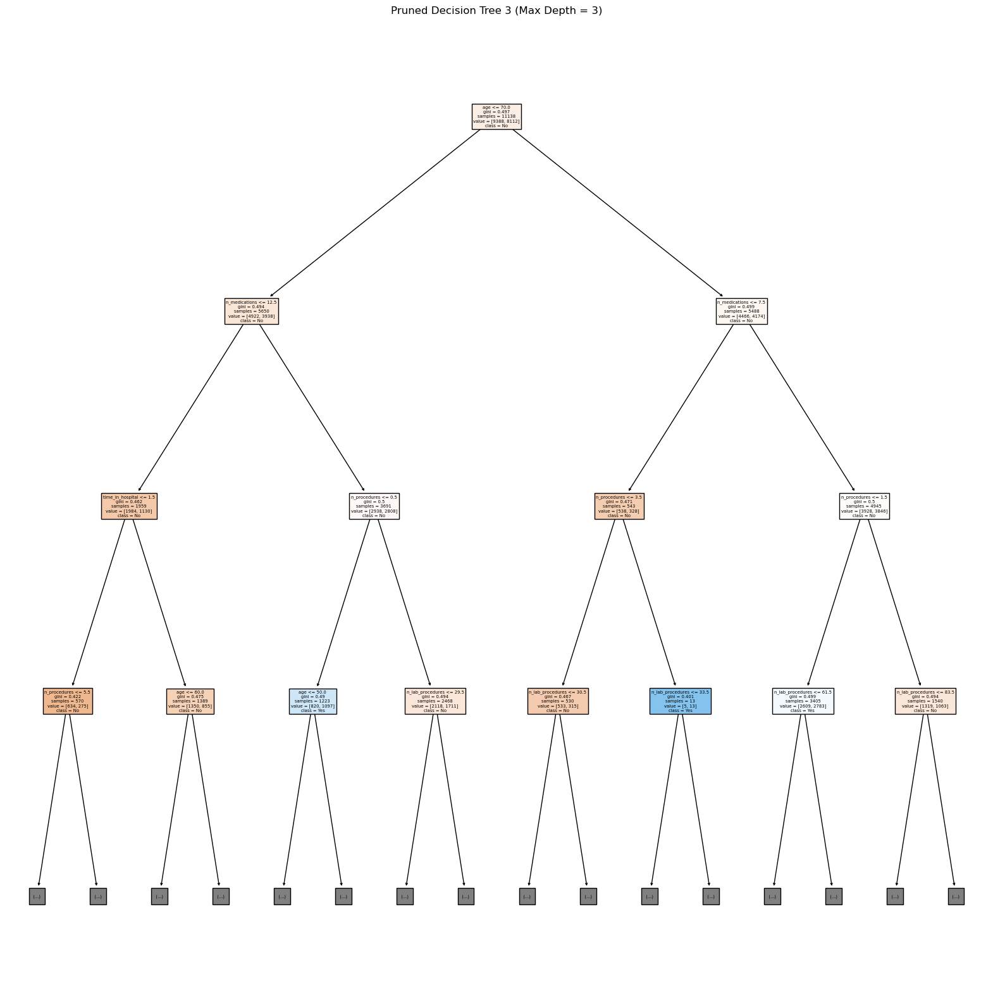

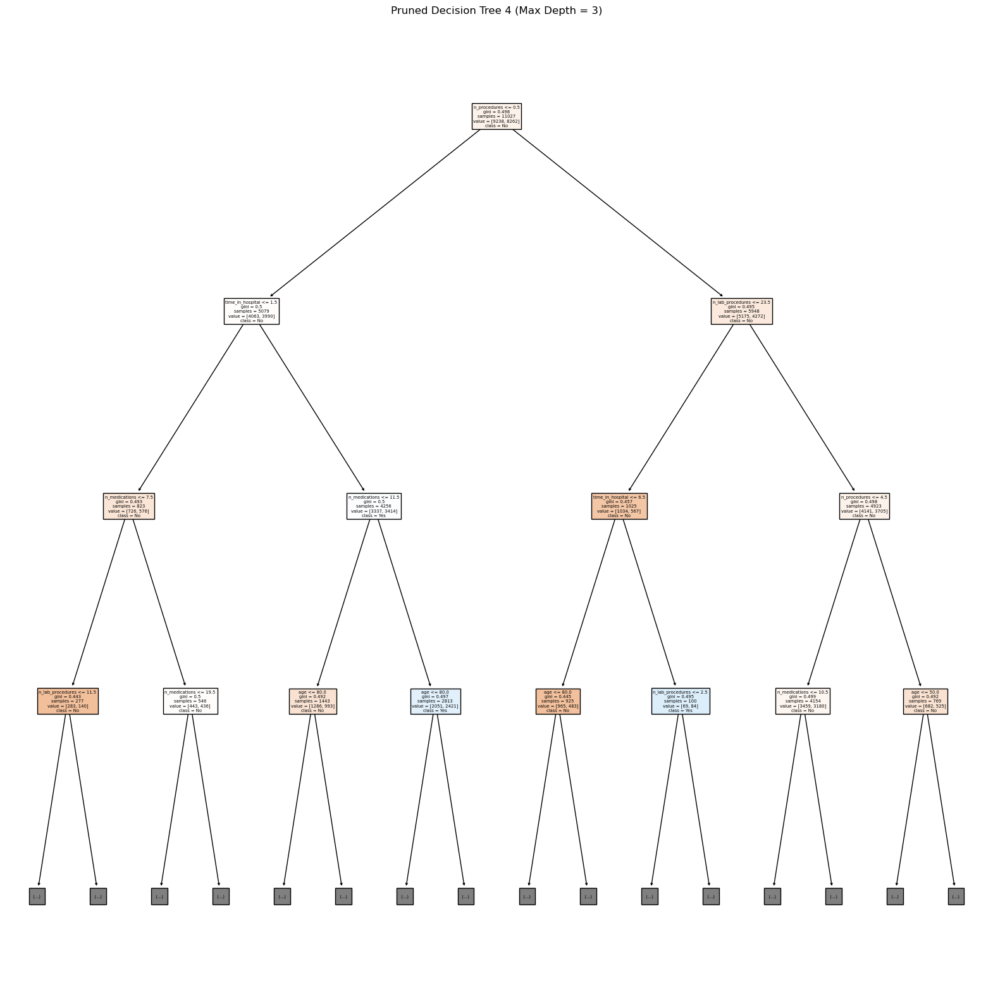

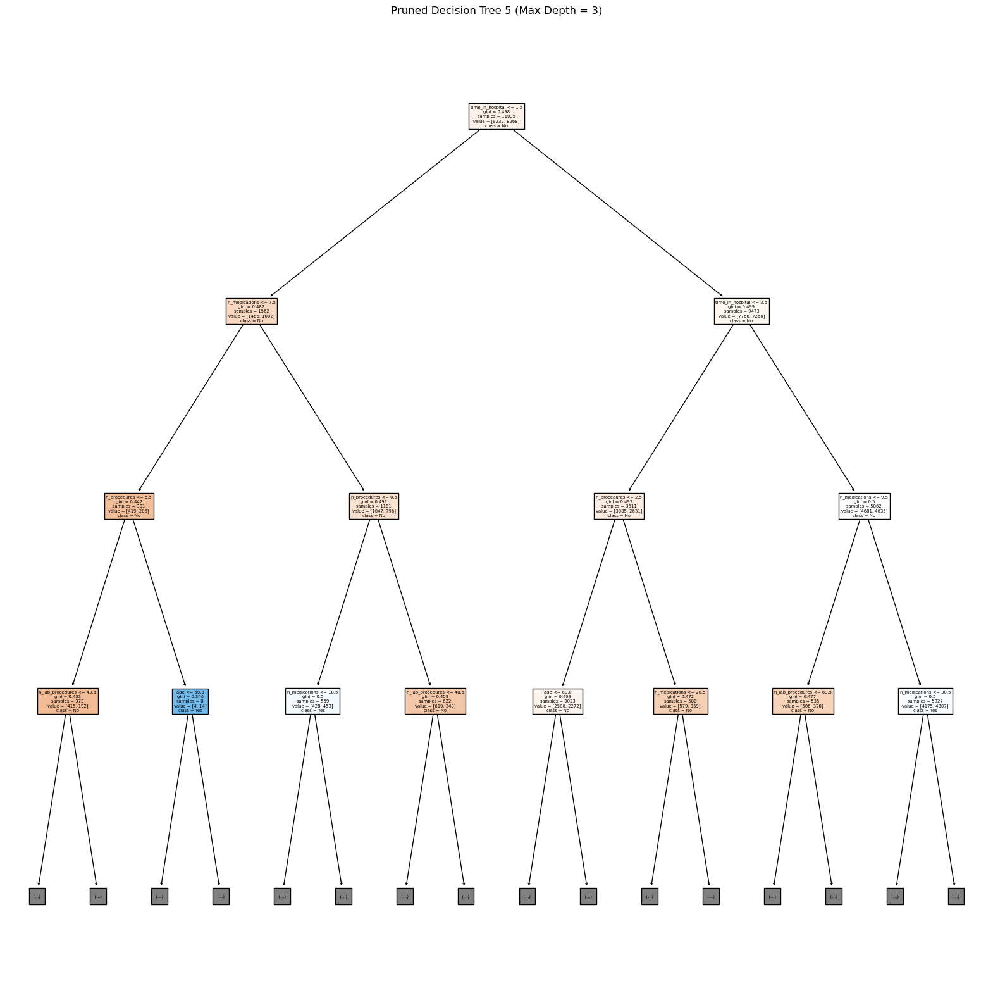

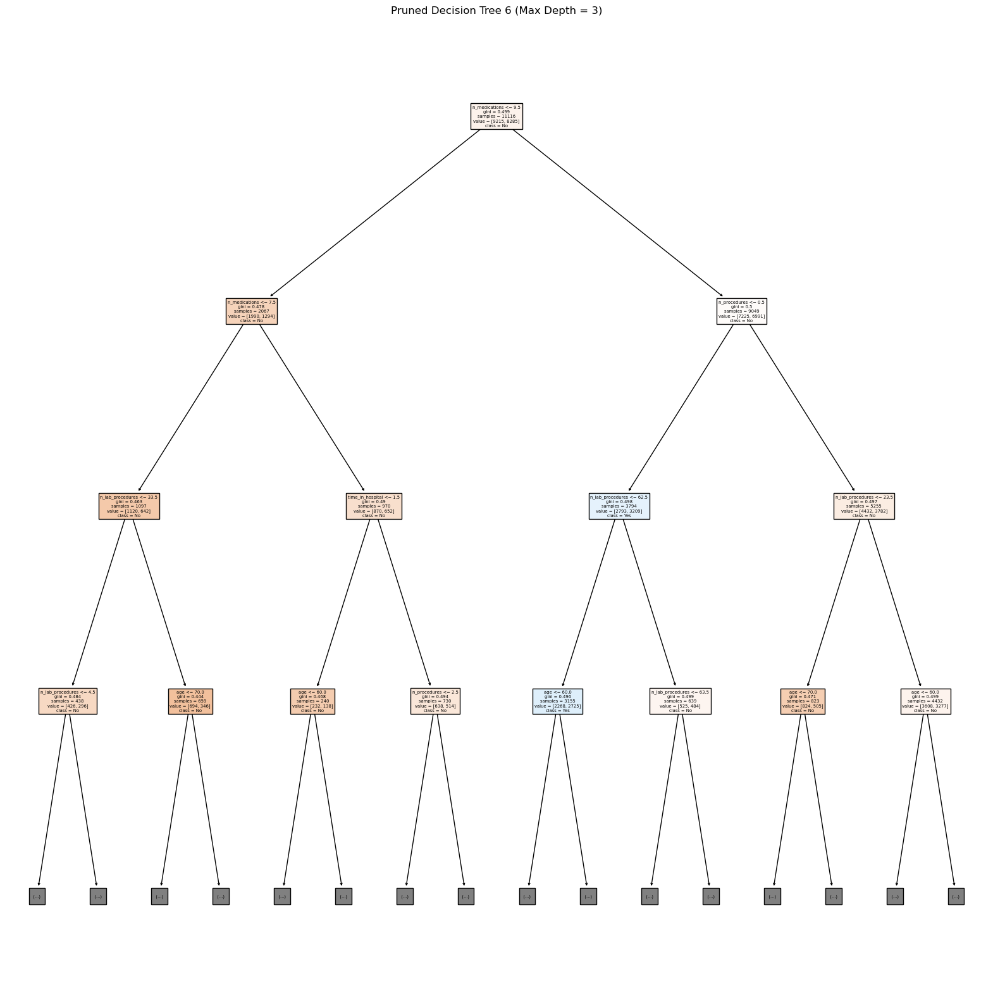

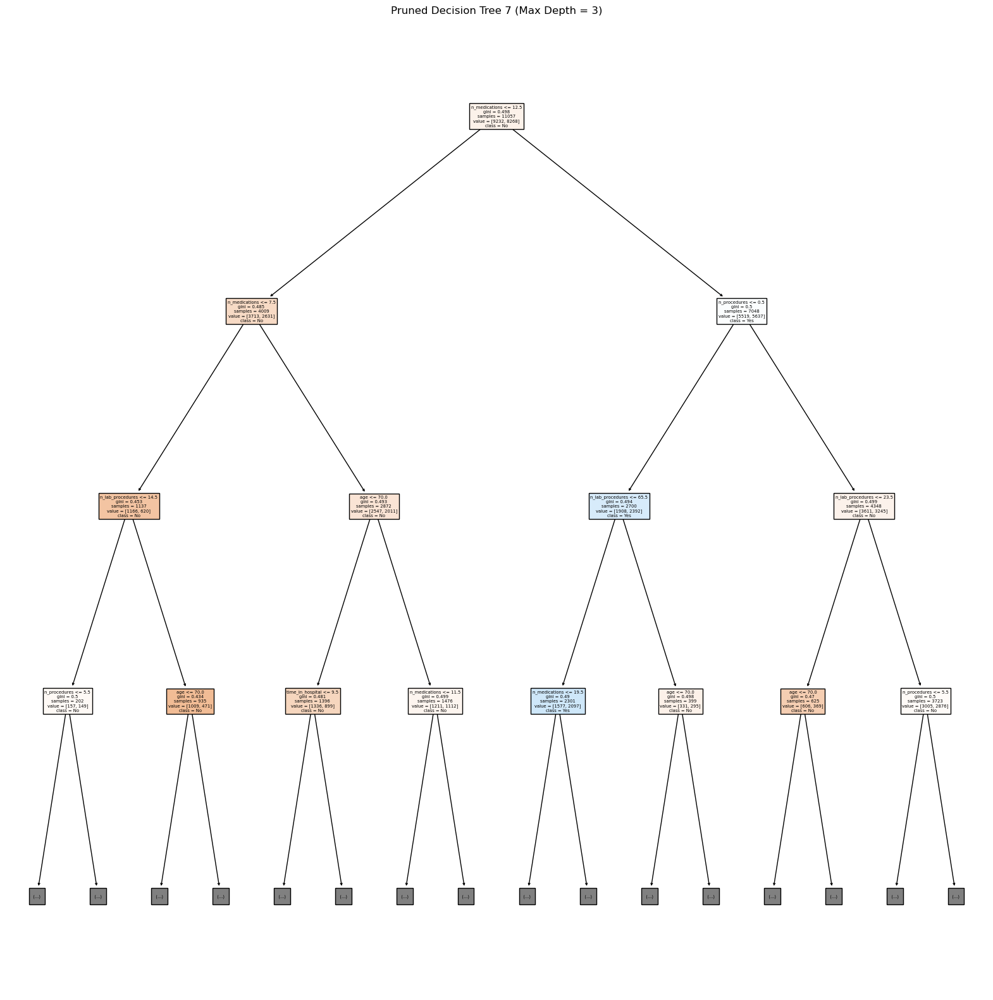

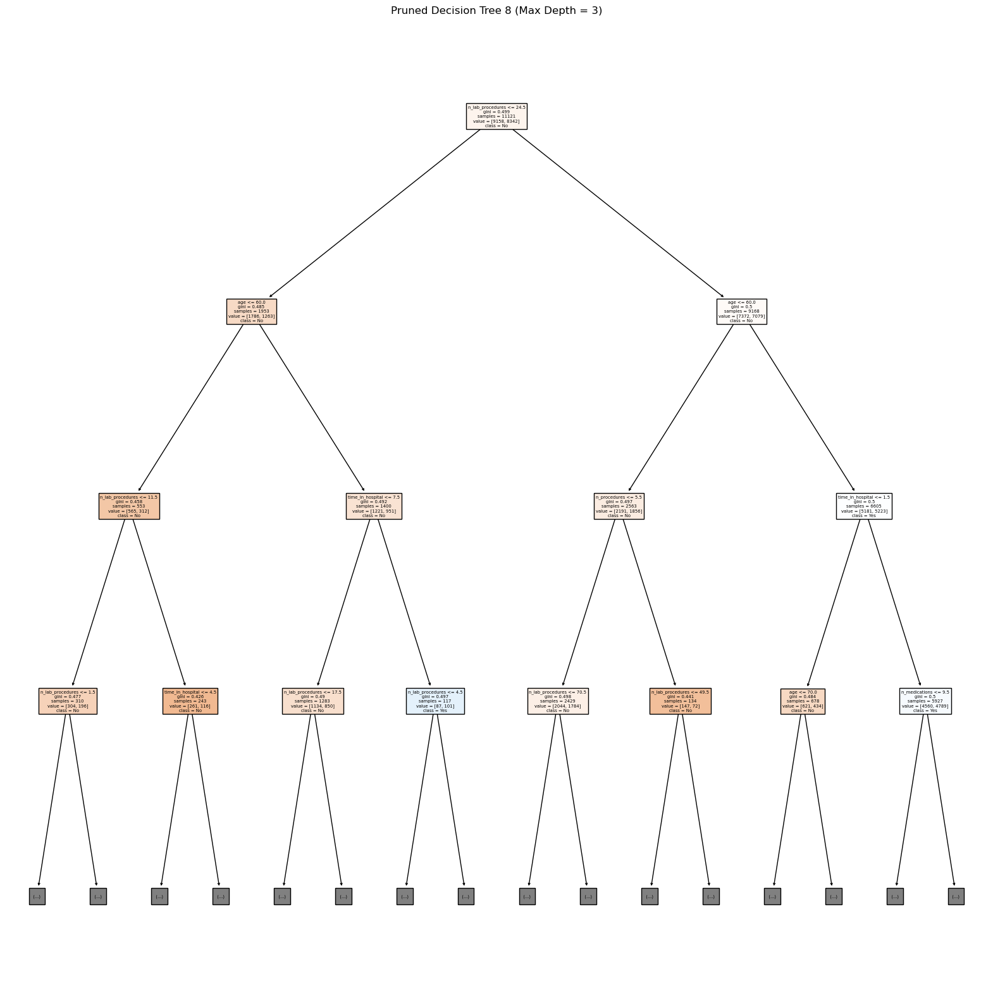

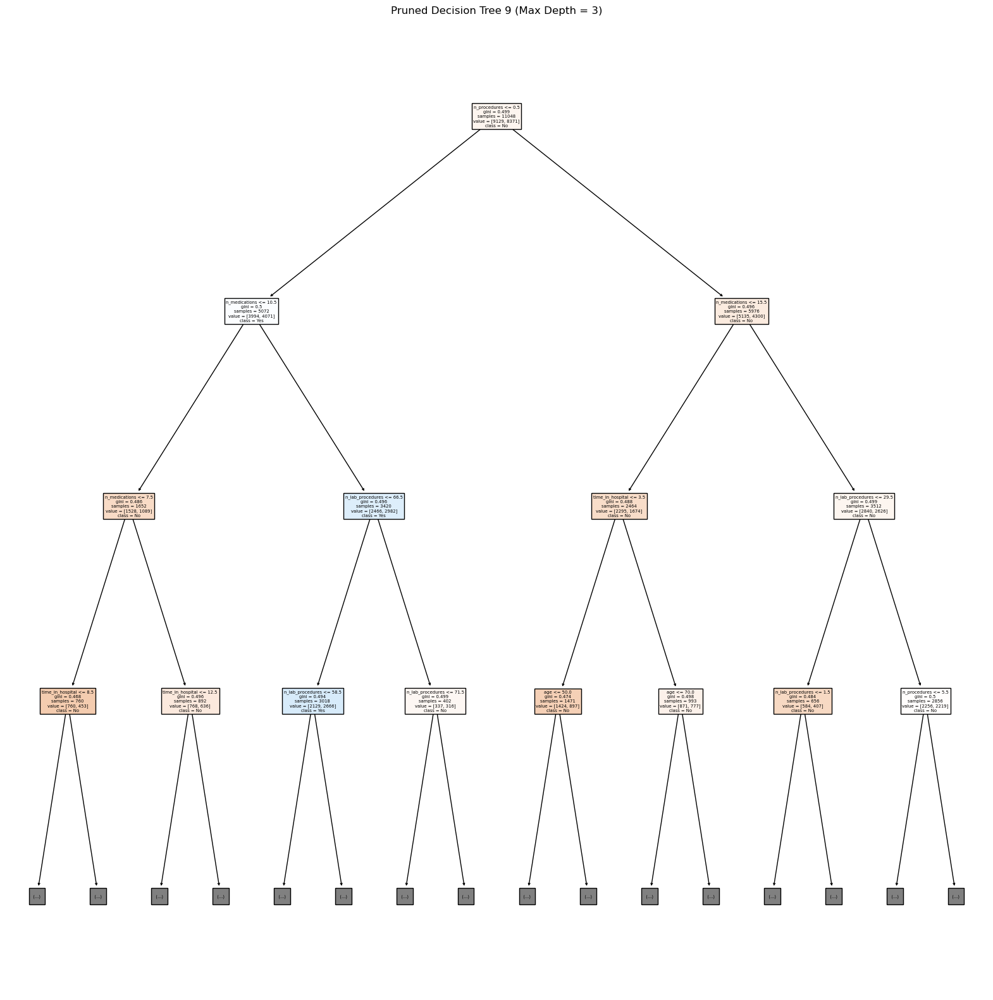

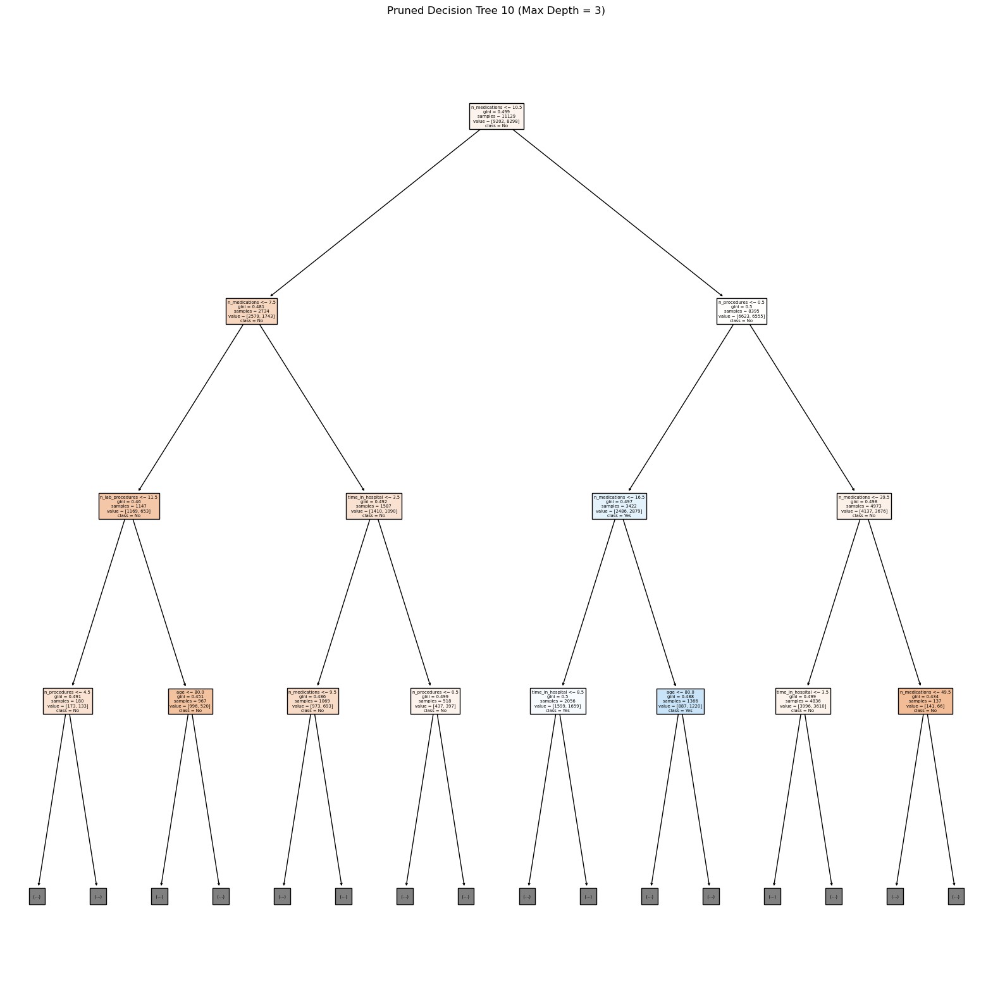

In [64]:
from sklearn import tree
import matplotlib.pyplot as plt

# Loop through the first 10 trees in the Random Forest
for i, estimator in enumerate(rf.estimators_[:10]):  # Access the first 10 trees
    plt.figure(figsize=(20, 20))
    _ = tree.plot_tree(
        estimator,
        feature_names=features,
        class_names=['No', 'Yes'],  # Replace with your class names
        filled=True,
        max_depth=3  # Prune the tree to a depth of 3
    )
    plt.title(f"Pruned Decision Tree {i+1} (Max Depth = 3)")
    plt.show()



The observations deduced from the analysis of the Random Forest model with pruned model indicate both parsimony and robustness of the model. To avoid modeling becoming overly complex or fitting the noise in the data, each tree is restricted to three levels. Every pruned tree gives its own decision result based on feature splits and this makes an enhancement of the overall predictive accuracy.

The pruned trees are indicative of how the data divides at each level as to the necessity of the features like age, time in hospital, or number of medications for outcomes such as readmission. The tree structures in the decision tree help capture differences in the patterns hence the incorporation of increased diversity gives it more solidity. However, due to limited depth, some details may fail to be represented by an individual tree, but this is compensated by averging over trees.

In general, this approach provides that the model is interpretable and has reasonable performance with the particular note that there is a good compromise between the modelcomplexity and prediction accuracy. It is especially helpful to be able identify what drives the model while making predictions and at the same time ensure that it is accurate.